In [1]:
sessionInfo()

R version 4.3.1 (2023-06-16)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Springdale Open Enterprise Linux 8.8 (Modena)

Matrix products: default
BLAS/LAPACK: /scratch/gpfs/KANG/hirak/mambaforge/envs/r43/lib/libopenblasp-r0.3.23.so;  LAPACK version 3.11.0

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

time zone: America/New_York
tzcode source: system (glibc)

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

loaded via a namespace (and not attached):
 [1] digest_0.6.33   IRdisplay_1.1   utf8_1.2.4      base64enc_0.1-3
 [5] fastmap_1.1.1   glue_1.6.2      htmltools_0.5.6 repr_1.1.6     
 [9] lifecycle_1.0.4 cli_3.6.

# Goal 
To do cross species alignment between human and mouse organoid samples 
Human data - 
```
/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/data/dong_et_al/6_sample_tumor_int.rds

```

organoid data - 
```
glue::glue(
        '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
        'results/seurat_2/',
        'organoid/combined_new_6_samples_annotated.rds'
    )
```

In [1]:
suppressPackageStartupMessages({
    library(Seurat)
    library(dplyr)
    library(ggplot2)
    library(ComplexHeatmap)
    library(circlize)
    library(biomaRt)
    library(scCustomize)
    library(wesanderson)
    library(data.table)
})

In [2]:
fig.size <- function (height, width) {
    options(repr.plot.height = height, repr.plot.width = width)
}

In [3]:
mouse_human_genes = read.csv('/scratch/gpfs/KANG/hirak/HOM_MouseHumanSequence.rpt', sep='\t')

In [4]:
mouse <- split.data.frame(mouse_human_genes,mouse_human_genes$Common.Organism.Name)[[2]]
human <- split.data.frame(mouse_human_genes,mouse_human_genes$Common.Organism.Name)[[1]]

In [5]:
mouse <- mouse[,c(1,4)]
human <- human[,c(1,4)]

In [6]:
mh_data <- merge.data.frame(mouse,human,by = "DB.Class.Key",all.y = TRUE) 

In [7]:
mh_data <- mh_data[,c(2,3)]

In [8]:
colnames(mh_data) = c('mouse', 'human')

In [3]:
organoid = readRDS(glue::glue(
        '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
        'results/seurat_2/',
        'organoid/combined_new_6_samples_annotated.rds'
))

In [6]:
organoid$orig.ident %>% unique

[1] "no_6_PT"  "no_6_5"   "no_6_0"   "no_50_0"  "no_50_5"  "no_50_PT"

In [10]:
tumor.int = readRDS('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/data/dong_et_al/6_sample_tumor_int.rds')
six_annot = openxlsx::read.xlsx('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/spread_sheet/6_samples_dong_integration_annotations.xlsx')
tumor.int@meta.data$annot = as.factor( six_annot$Annotation[ tumor.int$`integrated_snn_res.0.5` ])

In [ ]:
organoid$orgi.ident %>% unique

In [ ]:
tumor.int$orig.ident %>% uqique

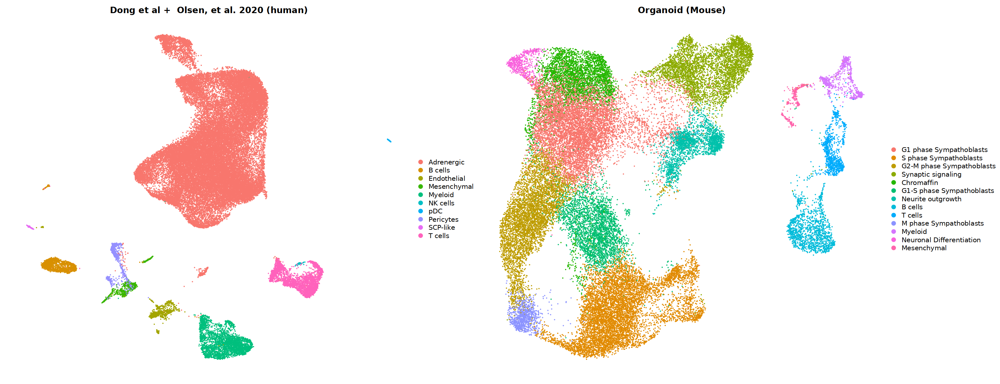

In [46]:
fig.size(10,26)
p.hs = DimPlot(tumor.int, label = F, repel = T, reduction = "umap", 
               group.by = "annot")+labs(title="Dong et al +  Olsen, et al. 2020 (human)") + NoAxes()

p.mm = DimPlot(organoid, label = F, repel = T, reduction = "umap",
               group.by = "annot")+labs(title="Organoid (Mouse)") + NoAxes()
p.hs | p.mm


## Rename mouse genes to human

In [15]:
RenameGenesSeurat <- function(obj, mh_data) { 
    # obj is object for mouse
    #
    mh_dict = mh_data$human
    names(mh_dict) = mh_data$mouse 
    common_genes = intersect( obj %>% rownames, names(mh_dict) ) 
    obj.subset = obj[common_genes, ]
    # Replace gene names in different slots of a Seurat object. Run this before integration. Run this before integration. It only changes obj@assays$RNA@counts, @data and @scale.data.
    print("Run this before integration. It only changes obj@assays$RNA@counts, @data and @scale.data.")
    RNA <- obj.subset@assays$RNA
    newnames = mh_dict[obj.subset %>% rownames] 
    
    if (nrow(RNA) == length(newnames)) {
    if (length(RNA@counts)) RNA@counts@Dimnames[[1]]            <- newnames
    if (length(RNA@data)) RNA@data@Dimnames[[1]]                <- newnames
    if (length(RNA@scale.data)) RNA@scale.data@Dimnames[[1]]    <- newnames
    } else {"Unequal gene sets: nrow(RNA) != nrow(newnames)"}
    obj.subset@assays$RNA <- RNA
    return(obj.subset)
}

In [16]:
organoid.gene.subset = RenameGenesSeurat(organoid, mh_data)

[1] "Run this before integration. It only changes obj@assays$RNA@counts, @data and @scale.data."


In [17]:
organoid.gene.subset[['integrated']] = NULL

In [18]:
tumor.int@meta.data %>% pull(orig.ident) %>% unique

[1] "T162" "T200" "T230" "NB16" "NB21" "NB22"

In [19]:
DefaultAssay(tumor.int) = "RNA"

In [20]:
organoid.gene.subset$species = "mouse"
tumor.int$species = "human"

In [21]:
organoid.gene.subset@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,integrated_snn_res.0.5,seurat_clusters,annot,species
,<chr>,<dbl>,<int>,<dbl>,<fct>,<fct>,<fct>,<chr>
AAACCCAAGCGTCAGA-1_1,no_6_PT,3772,1712,4.3163673,2,2,G2-M phase Sympathoblasts,mouse
AAACCCAAGGGCTAAC-1_1,no_6_PT,4107,1985,3.0698740,5,5,G1-S phase Sympathoblasts,mouse
AAACCCAAGTGATAAC-1_1,no_6_PT,3457,1525,3.6448342,0,0,G1 phase Sympathoblasts,mouse
AAACCCACAATCGCGC-1_1,no_6_PT,6955,2867,3.0586350,1,1,S phase Sympathoblasts,mouse
AAACCCACACCTGAAT-1_1,no_6_PT,5608,2248,3.7857022,2,2,G2-M phase Sympathoblasts,mouse
AAACCCACAGACCATT-1_1,no_6_PT,5272,1975,2.8708134,4,4,Chromaffin,mouse
AAACCCAGTCTTCTAT-1_1,no_6_PT,6733,2456,1.6820858,2,2,G2-M phase Sympathoblasts,mouse
AAACCCAGTTCCAGGC-1_1,no_6_PT,3862,1712,2.1050085,2,2,G2-M phase Sympathoblasts,mouse
AAACCCATCATTCCTA-1_1,no_6_PT,4717,2096,2.8880866,10,10,M phase Sympathoblasts,mouse


In [22]:
objlist = list(mouse = organoid.gene.subset, human = tumor.int)

In [23]:
objlist <- lapply(X = objlist, FUN = function(x) {
  y = CreateSeuratObject(counts = x@assays$RNA$counts, meta.data = x@meta.data, min.cells = 3) 
  y = CellCycleScoring(y, s.features = Seurat::cc.genes.updated.2019$s.genes, g2m.features = Seurat::cc.genes.updated.2019$g2m.genes)
  y = NormalizeData(y, verbose=F)
  y = FindVariableFeatures(y, selection.method = "vst", nfeatures = 5000, verbose = FALSE)
  y
})

Warning message:
“Non-unique features (rownames) present in the input matrix, making unique”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“The following arguments are not used: nselect”
Warning message:
“The following arguments are not used: nselect”


## We are using RPCA

In [25]:
features <- SelectIntegrationFeatures(object.list = objlist, verbose = F)

In [26]:
objlist <- lapply(X = objlist, FUN = function(x) {
    x <- ScaleData(x, features = features, verbose = FALSE)
      x <- RunPCA(x, features = features, verbose = FALSE)
})

In [27]:
obj.anchors <- FindIntegrationAnchors(object.list = objlist, anchor.features = features, reduction = 'rpca',
                                        k.anchor = 10, l2.norm = TRUE)

Scaling features for provided objects

Computing within dataset neighborhoods

Finding all pairwise anchors

Warning message:
“`invoke()` is deprecated as of rlang 0.4.0.
Please use `exec()` or `inject()` instead.
This warning is displayed once every 8 hours.”
Warning message:
“Different cells and/or features from existing assay RNA”
Warning message:
“Different cells and/or features from existing assay RNA”
Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 5408 anchors



In [28]:
object <- IntegrateData(anchorset = obj.anchors, k.weight=100, verbose = F)

In [29]:
DefaultAssay(object) <- "integrated"
npcs = 200
object <- ScaleData(object, verbose = FALSE)
object <- RunPCA(object, npcs = 200, verbose = FALSE)
object <- RunUMAP(object, reduction = "pca", dims = 1:200, return.model = T,
                    min.dist=0.3, n.neighbors = 50, verbose = T)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
UMAP will return its model

19:31:08 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

19:31:08 Read 89923 rows and found 200 numeric columns

19:31:08 Using Annoy for neighbor search, n_neighbors = 50

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

19:31:08 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

19:31

In [30]:
object = FindNeighbors(object, reduction = "pca", dims=1:npcs, verbose=T)
object = FindClusters(object, graph.name = "integrated_nn", method = 4, verbose=T)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 89923
Number of edges: 776707

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9178
Number of communities: 1875
Elapsed time: 6 seconds


1825 singletons identified. 50 final clusters.



In [31]:
object@meta.data$integrated_clusters = object@meta.data$seurat_clusters

In [32]:
saveRDS(
    object,
    glue::glue(
        '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
        'results/seurat_2/',
        'organoid/organoid_dong_integrated.rds'
))

------------------------------------------------------------------------------------------------------

In [3]:
object = readRDS(
    glue::glue(
        '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
        'results/seurat_2/',
        'organoid/organoid_dong_integrated.rds'
)
)

In [4]:
object@meta.data %>% head

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,integrated_snn_res.0.5,seurat_clusters,annot,species,S.Score,G2M.Score,Phase,scDblFinder.class,scDblFinder.score,integrated_snn_res.0.2,integrated_snn_res.0.4,integrated_snn_res.0.6,integrated_nn_res.0.8,integrated_clusters
,<chr>,<dbl>,<int>,<dbl>,<chr>,<fct>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<fct>,<fct>
AAACCCAAGCGTCAGA-1_1,no_6_PT,3815,1727,4.316367,2,2,G2-M phase Sympathoblasts,mouse,-0.03919931,0.31833640,G2M,NA,NA,NA,NA,NA,2,2
AAACCCAAGGGCTAAC-1_1,no_6_PT,4126,1992,3.069874,5,1,G1-S phase Sympathoblasts,mouse,0.30700019,-0.48858969,S,NA,NA,NA,NA,NA,1,1
AAACCCAAGTGATAAC-1_1,no_6_PT,3491,1532,3.644834,0,2,G1 phase Sympathoblasts,mouse,-0.07299131,-0.36274182,G1,NA,NA,NA,NA,NA,2,2
AAACCCACAATCGCGC-1_1,no_6_PT,7029,2882,3.058635,1,1,S phase Sympathoblasts,mouse,0.64121276,-0.04558548,S,NA,NA,NA,NA,NA,1,1
AAACCCACACCTGAAT-1_1,no_6_PT,5664,2254,3.785702,2,2,G2-M phase Sympathoblasts,mouse,0.24708020,-0.11709502,S,NA,NA,NA,NA,NA,2,2
AAACCCACAGACCATT-1_1,no_6_PT,5341,1975,2.870813,4,2,Chromaffin,mouse,-0.28573731,-0.86773150,G1,NA,NA,NA,NA,NA,2,2


Warning message:
“ggrepel: 14 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


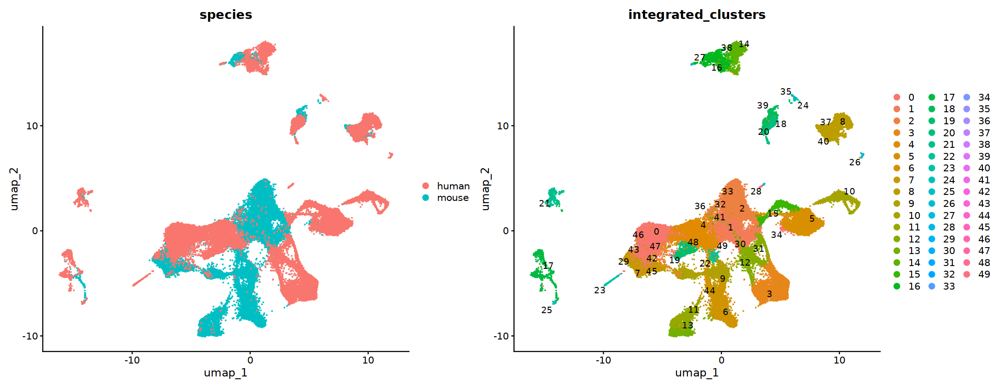

In [8]:
fig.size(7,18)
p1 = DimPlot(object, reduction = "umap", group.by = "species")
p2 = DimPlot(object, reduction = "umap", group.by = "integrated_clusters", label = TRUE,
    repel = TRUE)
p1 | p2

In [10]:
sig_genes=c('CARTPT','PRPH','PNMT','ISL1','STMN2','ELAVL4','TH','CHGA','PENK')

In [47]:
object@meta.data = object@meta.data %>% mutate(species_cluster = paste(annot, species, sep="_")) 

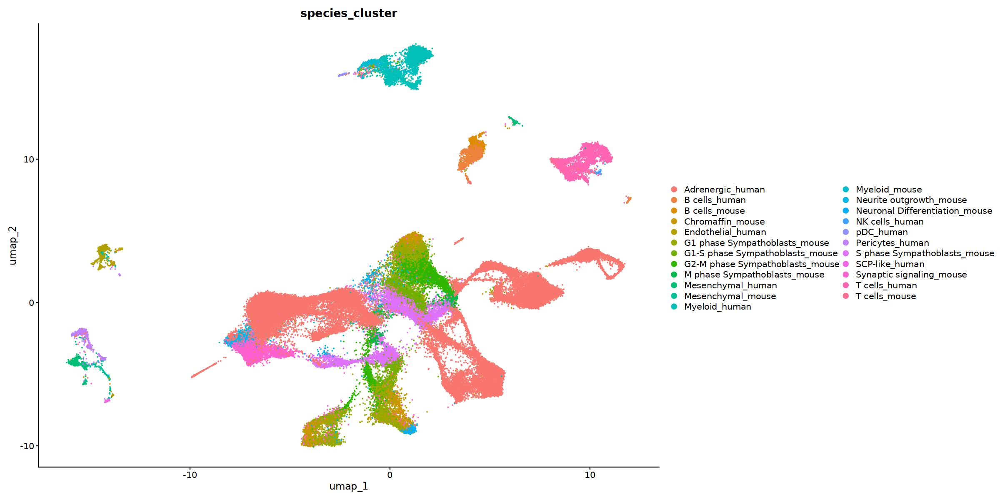

In [48]:
fig.size(10,20)
DimPlot(object, reduction = "umap", group.by = "species_cluster")

In [49]:
Idents(object) = "species_cluster"

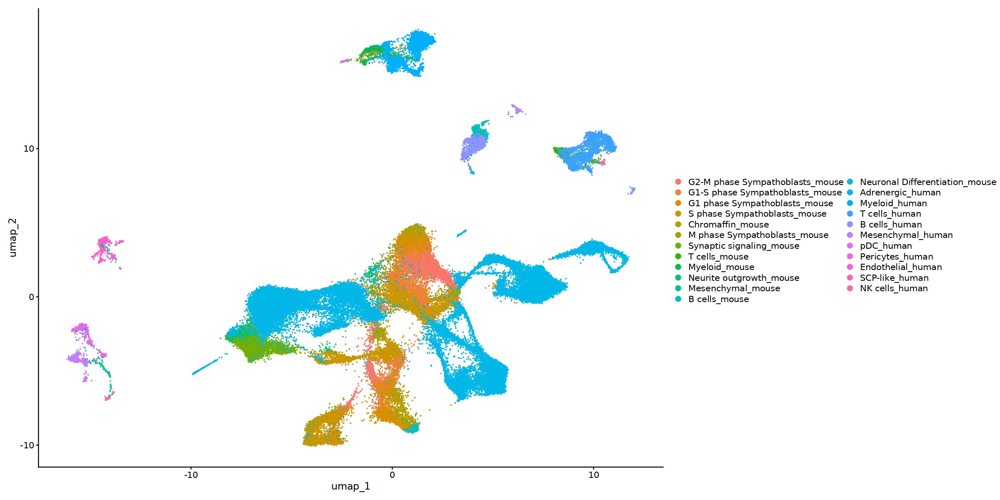

In [50]:
fig.size(10,20)
DimPlot(object, reduction = "umap")

In [51]:
object@meta.data %>% pull(species_cluster) %>% unique %>% sort

[1] "Adrenergic_human"                "B cells_human"                  
 [3] "B cells_mouse"                   "Chromaffin_mouse"               
 [5] "Endothelial_human"               "G1 phase Sympathoblasts_mouse"  
 [7] "G1-S phase Sympathoblasts_mouse" "G2-M phase Sympathoblasts_mouse"
 [9] "M phase Sympathoblasts_mouse"    "Mesenchymal_human"              
[11] "Mesenchymal_mouse"               "Myeloid_human"                  
[13] "Myeloid_mouse"                   "Neurite outgrowth_mouse"        
[15] "Neuronal Differentiation_mouse"  "NK cells_human"                 
[17] "pDC_human"                       "Pericytes_human"                
[19] "S phase Sympathoblasts_mouse"    "SCP-like_human"                 
[21] "Synaptic signaling_mouse"        "T cells_human"                  
[23] "T cells_mouse"

In [52]:
object.common = subset(
    x = object,
    idents = c(
        'B cells_human',
        'B cells_mouse',
        'Myeloid_human',
        'Myeloid_mouse',
        'Mesenchymal_human',
        'Mesenchymal_mouse',
        'T cells_human',
        'T cells_mouse'
    )
)

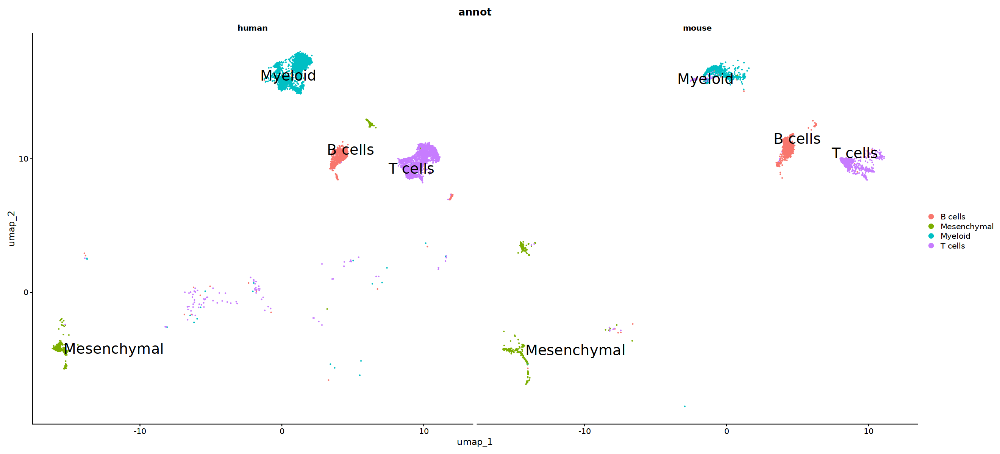

In [53]:
fig.size(10,22)
DimPlot(object.common, reduction = "umap", group.by='annot', split.by = 'species',
                 label=TRUE,repel=TRUE, label.size = 8)

In [54]:
#signature.df

In [55]:
object.uncommon = subset(
    x = object,
    idents = c(
        'B cells_human',
        'B cells_mouse',
        'Myeloid_human',
        'Myeloid_mouse',
        'Mesenchymal_human',
        'Mesenchymal_mouse',
        'T cells_human',
        'T cells_mouse'
    ),
    invert = TRUE
)

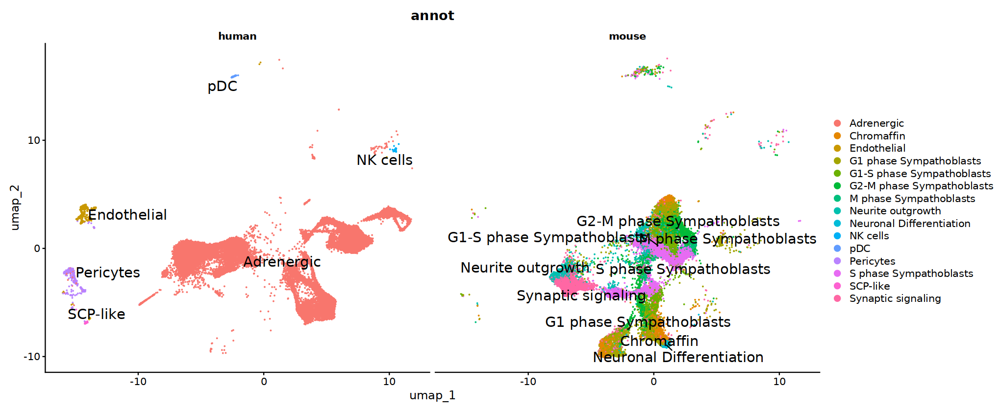

In [56]:
fig.size(7,17)
DimPlot(object.uncommon, reduction = "umap", group.by='annot', split.by = 'species',
                 label=TRUE,repel=TRUE, label.size = 6)

In [57]:
annotation.hs.df = openxlsx::read.xlsx(
    '../Figure3A_20230629_6_samples_dong_integration_annotations.xlsx')

In [58]:
signature.df = openxlsx::read.xlsx(
    '../spread_sheet/Figure5_20240214_No_6-50_Organoids_survival_signatures.xlsx'
)

In [59]:
signature.df

,Cluster_Number,Annotation,Mouse.Gene,Human.Gene
,<dbl>,<chr>,<chr>,<chr>
1,3,Synaptic signaling,Tsix,TSIX
2,3,Synaptic signaling,Ktn1,KTN1
3,3,Synaptic signaling,Nsd1,NSD1
4,3,Synaptic signaling,Dhx36,DHX36
5,6,Neurite outgrowth,Fdps,FDPS
6,6,Neurite outgrowth,Sod1,SOD1
7,6,Neurite outgrowth,Pgk1,PGK1
8,6,Neurite outgrowth,Tbca,TBCA
9,8,S phase Sympathoblasts,Baiap2,BAIAP2


In [60]:
object@meta.data[, 'annot.old'] = object@meta.data$annot

In [61]:
annot.dict = annotation.hs.df$Annotation[ tumor.int@meta.data$`integrated_snn_res.0.5` ]

In [62]:
tumor.int@meta.data$`integrated_snn_res.0.5` %>% length

[1] 50330

In [63]:
names(annot.dict) = tumor.int@meta.data %>% row.names

In [64]:
annot.dict %>% head

AAACCCAAGATCCAAA.1_1      AAACCCAAGCACAAAT.1_1      AAACCCAAGCACTTTG.1_1 
               "Immature"                "Immature"  "S phase Sympathoblasts" 
     AAACCCAAGGCAGGGA.1_1      AAACCCACAACCCTCT.1_1      AAACCCACAAGCCATT.1_1 
"G1 phase Sympathoblasts"  "S phase Sympathoblasts"          "Sympathoblasts"

In [65]:
object@meta.data[ object@meta.data %>% filter(species == 'human') %>% rownames , 'annot'] = annot.dict[object@meta.data %>% filter(species == 'human') %>% rownames]

In [66]:
object@meta.data %>% pull(annot) %>% unique %>% sort

[1] "Adrenergic"                "B cells"                  
 [3] "Chromaffin"                "Endothelial"              
 [5] "G1 phase Sympathoblasts"   "G1-S phase Sympathoblasts"
 [7] "G2-M phase Sympathoblasts" "G2M phase Sympathoblasts" 
 [9] "Immature"                  "M phase Sympathoblasts"   
[11] "Mature"                    "Mesenchymal"              
[13] "Myeloid"                   "Neurite outgrowth"        
[15] "Neuronal Differentiation"  "NK cells"                 
[17] "pDC"                       "Pericytes"                
[19] "S phase Sympathoblasts"    "SCP-like"                 
[21] "Sympathoblasts"            "Synaptic signaling"       
[23] "T cells"

In [67]:
object@meta.data[, 'annot.backup'] = object@meta.data$annot

In [68]:
object$annot = gsub("G1 phase Sympathoblasts", "Sympathoblasts", object$annot)
object$annot = gsub("G1-S phase Sympathoblasts", "Sympathoblasts", object$annot)
object$annot = gsub("G2-M phase Sympathoblasts", "Sympathoblasts", object$annot)
object$annot = gsub("G2M phase Sympathoblasts", "Sympathoblasts", object$annot)
object$annot = gsub("S phase Sympathoblasts", "Sympathoblasts", object$annot)

In [69]:
object$annot = gsub("M phase Sympathoblasts", "Sympathoblasts", object$annot)

In [70]:
table(object$annot)


              Adrenergic                  B cells               Chromaffin 
                     281                     3006                     6292 
             Endothelial                 Immature                   Mature 
                     810                    11660                     2534 
             Mesenchymal                  Myeloid        Neurite outgrowth 
                    1128                     3905                     2344 
Neuronal Differentiation                 NK cells                      pDC 
                     631                       57                      107 
               Pericytes                 SCP-like           Sympathoblasts 
                     829                      130                    47999 
      Synaptic signaling                  T cells 
                    4272                     3938 

In [71]:
object@meta.data = object@meta.data %>% mutate(species_cluster = paste(annot, species, sep="_")) 

In [72]:
table(object$species_cluster) %>% names %>% sort

[1] "Adrenergic_human"               "B cells_human"                 
 [3] "B cells_mouse"                  "Chromaffin_human"              
 [5] "Chromaffin_mouse"               "Endothelial_human"             
 [7] "Immature_human"                 "Mature_human"                  
 [9] "Mesenchymal_human"              "Mesenchymal_mouse"             
[11] "Myeloid_human"                  "Myeloid_mouse"                 
[13] "Neurite outgrowth_mouse"        "Neuronal Differentiation_mouse"
[15] "NK cells_human"                 "pDC_human"                     
[17] "Pericytes_human"                "SCP-like_human"                
[19] "Sympathoblasts_human"           "Sympathoblasts_mouse"          
[21] "Synaptic signaling_mouse"       "T cells_human"                 
[23] "T cells_mouse"

In [73]:
Idents(object) = "species_cluster"

In [74]:
object.common = subset(
    x = object,
    idents = c(
        'B cells_human',
        'B cells_mouse',
        'Chromaffin_human',
        'Chromaffin_mouse',
        'Myeloid_human',
        'Myeloid_mouse',
        'Mesenchymal_human',
        'Mesenchymal_mouse',
        'Sympathoblasts_human',
        'Sympathoblasts_mouse',
        'T cells_human',
        'T cells_mouse'
    )
)

In [75]:
object.uncommon = subset(
    x = object,
    idents = c(
        'B cells_human',
        'B cells_mouse',
        'Chromaffin_human',
        'Chromaffin_mouse',
        'Myeloid_human',
        'Myeloid_mouse',
        'Mesenchymal_human',
        'Mesenchymal_mouse',
        'Sympathoblasts_human',
        'Sympathoblasts_mouse',
        'T cells_human',
        'T cells_mouse'
    ),
    invert = TRUE
)

In [76]:
detach("package:wesanderson", unload=TRUE)

In [77]:
library("wesanderson")

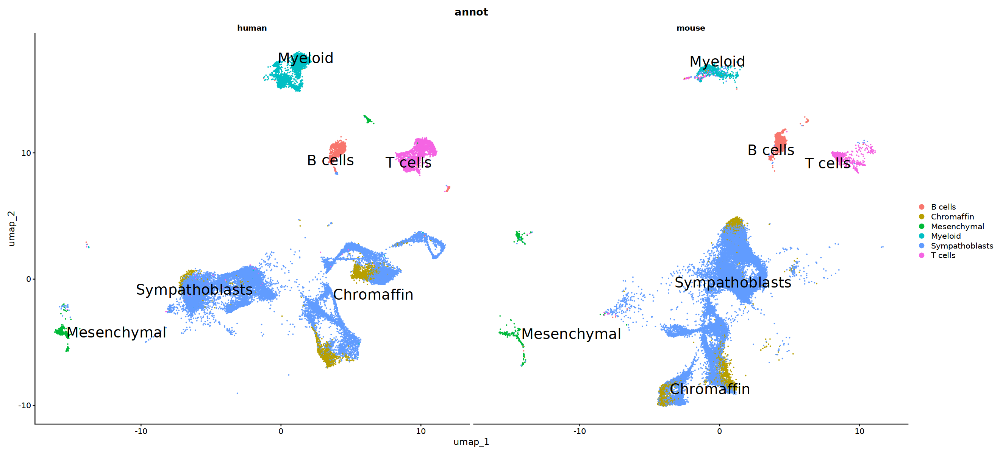

In [78]:
fig.size(10,22)
DimPlot(object.common, reduction = "umap", group.by='annot', split.by = 'species',
                 label=TRUE,repel=TRUE, label.size = 8)

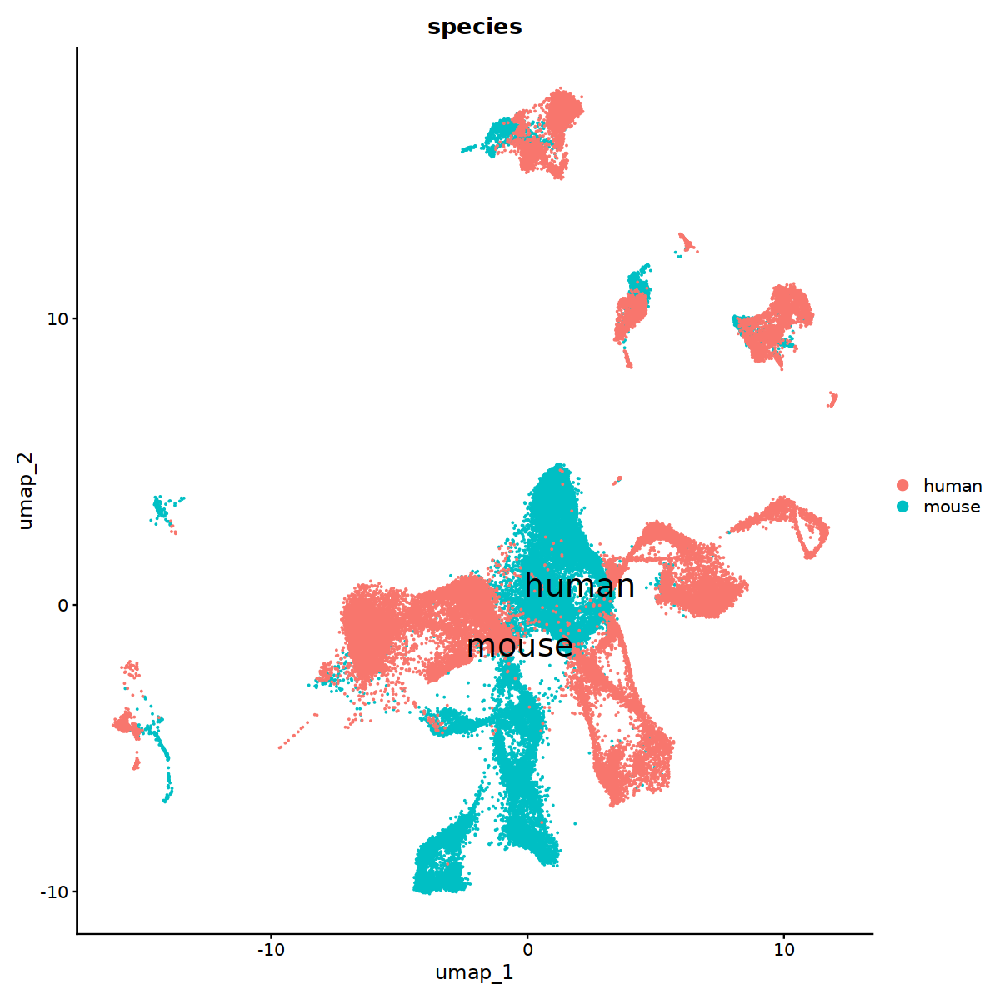

In [80]:
fig.size(10,10)
DimPlot(object.common, reduction = "umap", group.by='species',
                 label=TRUE,repel=TRUE, label.size = 8)

In [82]:
object.common.tumor = subset(
    x = object.common,
    idents = c(
        'Chromaffin_human',
        'Chromaffin_mouse',
        'Sympathoblasts_human',
        'Sympathoblasts_mouse'
        )
)

In [90]:
sig_genes[1:4]

[1] "CARTPT" "PRPH"   "PNMT"   "ISL1"

In [85]:
DefaultAssay(object.common.tumor) = "RNA"

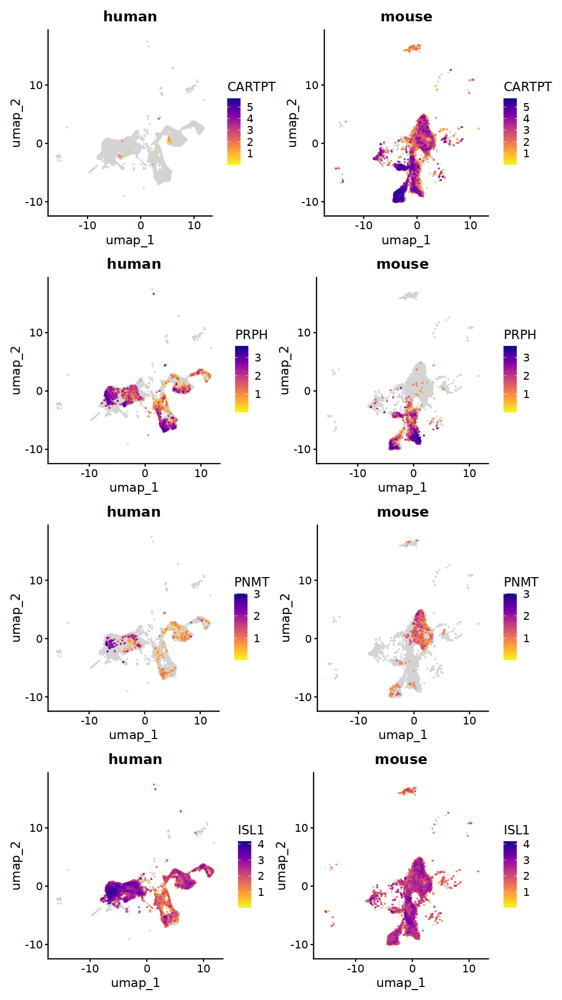

In [91]:
fig.size(16, 9)
FeaturePlot_scCustom(
    object.common.tumor, 
    reduction = "umap", 
    features = sig_genes[1:4],
    split.by = 'species')

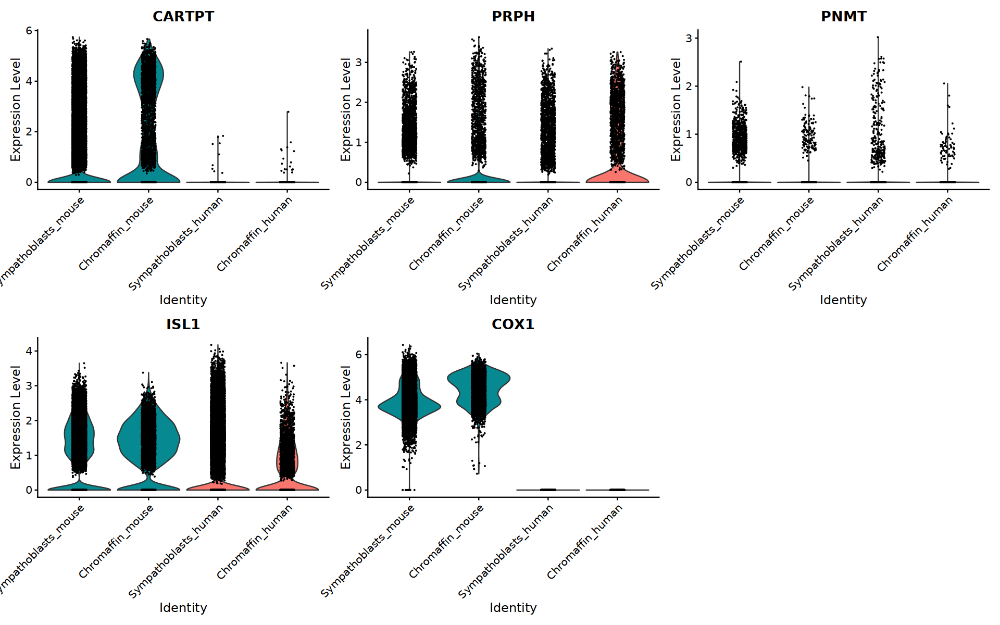

In [98]:
fig.size(10, 16)
VlnPlot(
    object.common.tumor, 
    features = c(sig_genes[1:4], 'COX1'),
    split.by = 'species')

In [ ]:
FindMarkers(
    object.common.tumor,
    
)

In [55]:
sig_groups = signature.df %>% 
    group_by(Annotation) %>%
    summarize(ValueList = list(Human.Gene), .groups = 'drop')
sig_groups_list = sig_groups$ValueList
names(sig_groups_list) = sig_groups$Annotation

In [56]:
sig_groups_list

$`Neurite outgrowth`
[1] "FDPS" "SOD1" "PGK1" "TBCA"

$`Neuronal Differentiation`
[1] "CRABP1" "ASS1"   "NOS1"   "HMX3"  

$`S phase Sympathoblasts`
[1] "BAIAP2" "FBXO5"  "CCNE1"  "DDIT4"  "CDKN1A"

$`Synaptic signaling`
[1] "TSIX"  "KTN1"  "NSD1"  "DHX36"

In [51]:
object.common$species_organoid = object.common$species

In [52]:
object.common@meta.data[object.common@meta.data %>% filter(species=='mouse') %>% filter(grepl("PT", orig.ident)) %>% rownames,
                        'species_organoid' ] = 'mouse_PT'

In [53]:
object.common@meta.data[object.common@meta.data %>% filter(species=='mouse') %>% filter(!grepl("PT", orig.ident)) %>% rownames,
                        'species_organoid' ] = 'mouse_organoid'

In [61]:
DefaultAssay(object.common) = "RNA"


NOTE: FeaturePlot_scCustom uses a specified `na_cutoff` when plotting to
color cells with no expression as background color separate from color scale.
Please ensure `na_cutoff` value is appropriate for feature being plotted.
Default setting is appropriate for use when plotting from 'RNA' assay.
When `na_cutoff` not appropriate (e.g., module scores) set to NULL to
plot all cells in gradient color palette.

-----This message will be shown once per session.-----


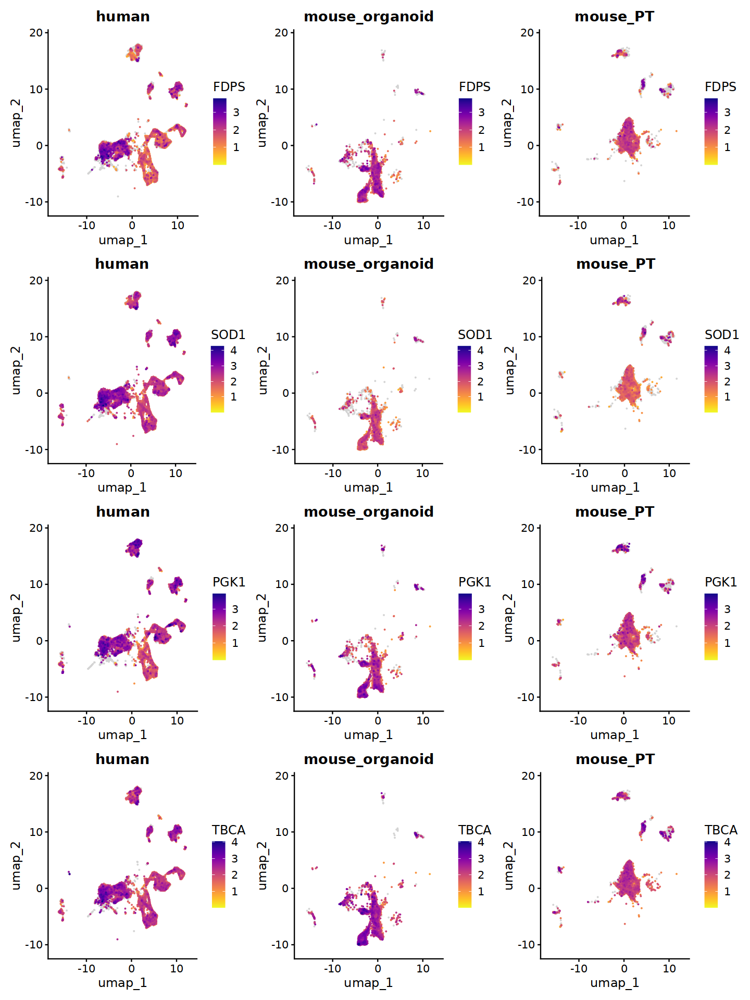

In [63]:
fig.size(16, 12)
FeaturePlot_scCustom(
    object.common, 
    reduction = "umap", 
    features = sig_groups_list$`Neurite outgrowth`,
    split.by = 'species_organoid')

In [29]:
object

An object of class Seurat 
28331 features across 89923 samples within 2 assays 
Active assay: integrated (2000 features, 2000 variable features)
 2 layers present: data, scale.data
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [32]:
fig.size(16, 16)
plot = FeaturePlot_scCustom(
    object, 
    reduction = "umap", 
    features = sig_genes)

Warning message:
“The following features were omitted as they were not found:
ℹ PNMT”


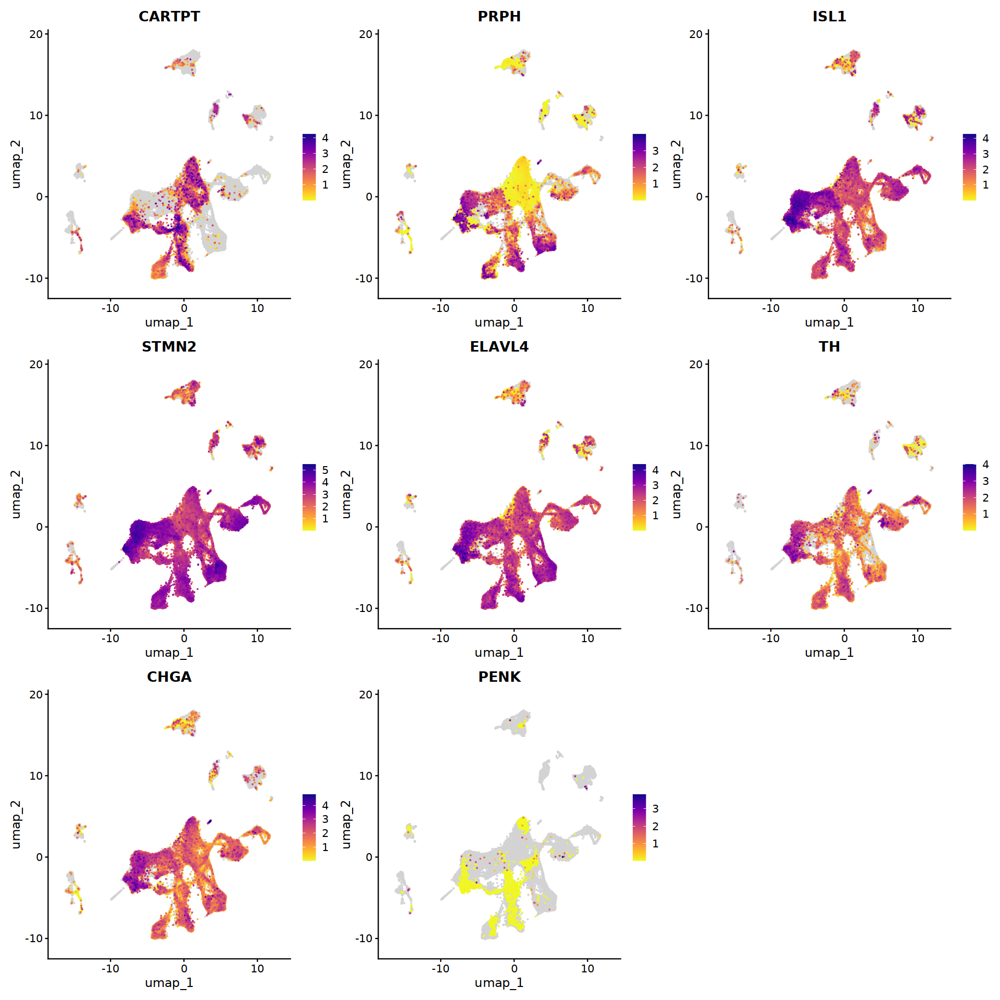

In [34]:
plot

In [33]:
ggsave(
    plot = plot,
    filename = glue::glue(
        '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
        'results/figures/2022/Figure_5/organoid_feature_plot_20240221.pdf'
    ),
    width = 16,
    height = 16,
    dpi=300
)

In [64]:
organoid

An object of class Seurat 
36410 features across 39593 samples within 2 assays 
Active assay: RNA (31410 features, 0 variable features)
 2 layers present: counts, data
 1 other assay present: integrated
 2 dimensional reductions calculated: pca, umap

In [68]:
object.common$species_organoid = object.common$annot

In [69]:
organoid@meta.data[organoid@meta.data %>% filter(grepl("PT", orig.ident)) %>% rownames,
                        'species_organoid' ] = 'Primary_Tumor'
organoid@meta.data[organoid@meta.data  %>% filter(!grepl("PT", orig.ident)) %>% rownames,
                        'species_organoid' ] = 'Organoid'

In [71]:
DefaultAssay(organoid) = "RNA"

In [100]:
sig_groups = signature.df %>% 
    group_by(Annotation) %>%
    summarize(ValueList = list(Mouse.Gene), .groups = 'drop')
sig_groups_list.mouse = sig_groups$ValueList
names(sig_groups_list.mouse) = sig_groups$Annotation

In [103]:
sig_groups_list.mouse %>% names

[1] "Neurite outgrowth"        "Neuronal Differentiation"
[3] "S phase Sympathoblasts"   "Synaptic signaling"

In [125]:
fig.size(16, 12)
plot.list = list()
for (label in sig_groups_list.mouse %>% names){
plot.list[[label]] = FeaturePlot_scCustom(
    organoid, 
    reduction = "umap", 
    features = sig_groups_list.mouse[[label]],
    split.by = 'species_organoid') + ggtitle(label)

ggsave(
    plot = plot.list[[label]],
    filename = glue::glue(
        '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
        'results/figures/2022/Figure_5/organoid_',
        label,
        '.pdf'
    ),
    width = 12,
    height = 16,
    dpi=300
)
plot.list[[label]] 
    }

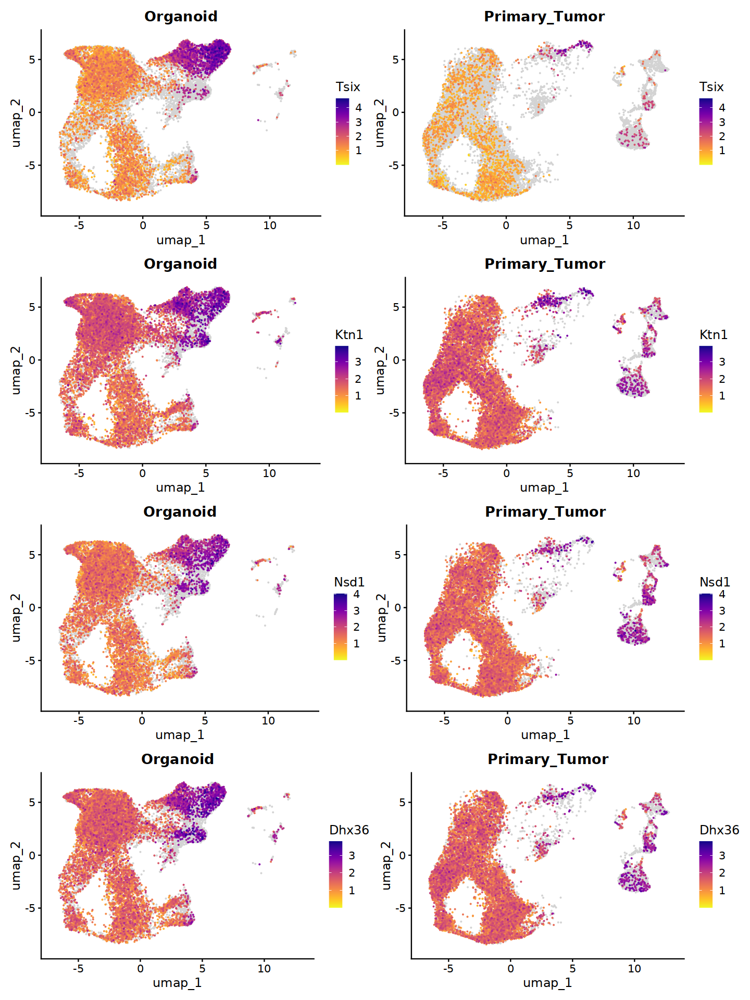

In [123]:
fig.size(16, 12)
plot.list[[label]]

In [109]:
library(gridExtra)


Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine




In [116]:
fig.size(16, 12)
plot.list %>% names

[1] "Neurite outgrowth"        "Neuronal Differentiation"
[3] "S phase Sympathoblasts"   "Synaptic signaling"

In [83]:
signature.df$Annotation %>% unique

[1] "Synaptic signaling"       "Neurite outgrowth"       
[3] "S phase Sympathoblasts"   "Neuronal Differentiation"

In [79]:
organoid$annot %>% levels

[1] "G1 phase Sympathoblasts"   "S phase Sympathoblasts"   
 [3] "G2-M phase Sympathoblasts" "Synaptic signaling"       
 [5] "Chromaffin"                "G1-S phase Sympathoblasts"
 [7] "Neurite outgrowth"         "B cells"                  
 [9] "T cells"                   "M phase Sympathoblasts"   
[11] "Myeloid"                   "Neuronal Differentiation" 
[13] "Mesenchymal"

In [86]:
organoid.subset = subset(
    x = organoid,
    idents = signature.df$Annotation %>% unique
)

#options(repr.plot.height=15, repr.plot.width=8, res=200)
fig.size(4,10)
#adr.obj.small = adr.obj[dotplot_genes$Gene[2: length(dotplot_genes$Gene)],]
pdot = DotPlot(
       organoid.subset, 
        assay='RNA',
        features = signature.df$Mouse.Gene %>% rev, 
        group.by='annot', 
        scale = TRUE,
        scale.by = 'size',
        cols = c("lightgrey", "darkred")
       )+ ggtitle("Mouse Signature Plot") +
        #coord_flip()+
    theme(
        plot.title = element_text(hjust = 0.5),
        axis.text.x = element_text(size=15,angle = 90, hjust = 1,vjust = 0.7),
        axis.text.y = element_text(size=15)
    ) 

pdot

In [127]:
organoid.subset$annot = droplevels( organoid.subset$annot)


In [128]:
levels(organoid.subset$annot)

[1] "S phase Sympathoblasts"   "Synaptic signaling"      
[3] "Neurite outgrowth"        "Neuronal Differentiation"

In [131]:
organoid.subset$annot = factor(organoid.subset$annot, levels = c(
    'Neuronal Differentiation',
    'S phase Sympathoblasts',
    'Neurite outgrowth',
    'Synaptic signaling'
))

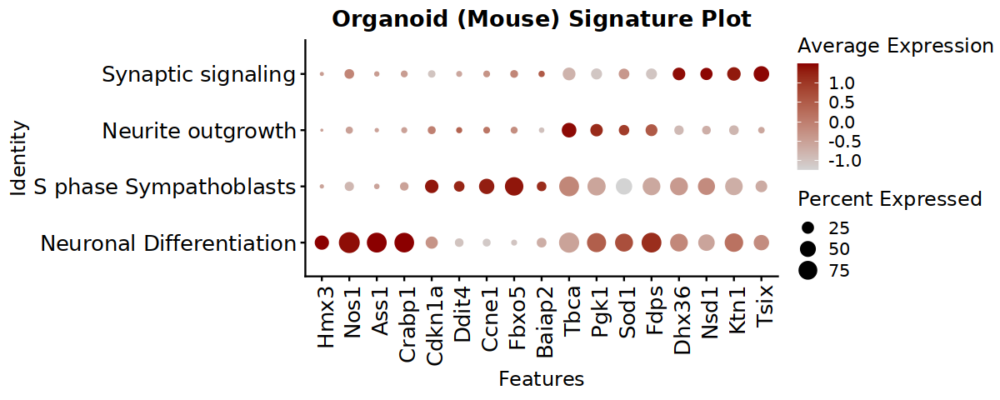

In [132]:
#options(repr.plot.height=15, repr.plot.width=8, res=200)
fig.size(4,10)
#adr.obj.small = adr.obj[dotplot_genes$Gene[2: length(dotplot_genes$Gene)],]
pdot = DotPlot(
       organoid.subset, 
        assay='RNA',
        features = signature.df$Mouse.Gene %>% rev, 
        group.by='annot', 
        scale = TRUE,
        scale.by = 'size',
        cols = c("lightgrey", "darkred")
       )+ ggtitle("Organoid (Mouse) Signature Plot") +
        #coord_flip()+
    theme(
        plot.title = element_text(hjust = 0.5),
        axis.text.x = element_text(size=15,angle = 90, hjust = 1,vjust = 0.7),
        axis.text.y = element_text(size=15)
    ) 

pdot

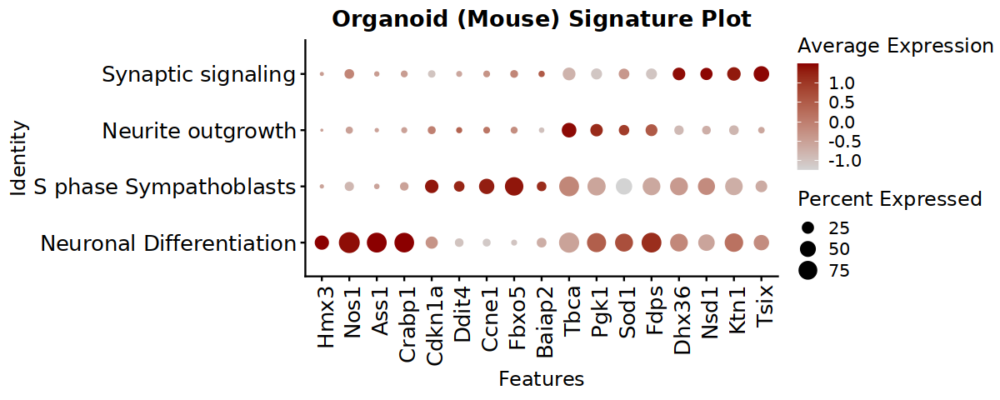

In [133]:
ggsave(
    plot = pdot,
    filename = glue::glue(
        '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
        'results/figures/2022/Figure_5/organoid_signature_dotplot.pdf'
    ),
    width = 10,
    height = 5,
    dpi=300
)
pdot

In [125]:
#object.common@meta.data

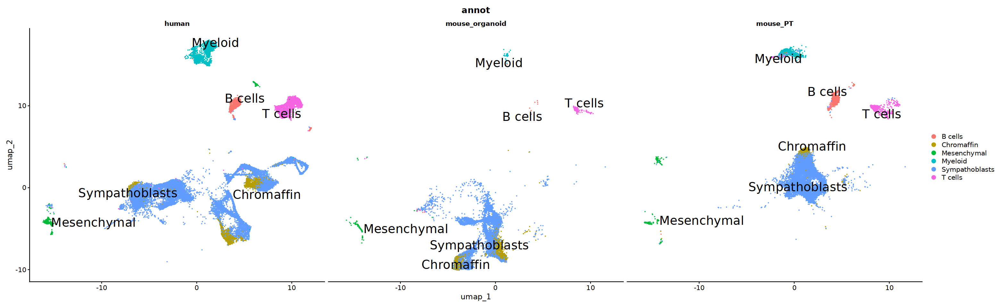

In [173]:
fig.size(8,26)
p = DimPlot(object.common, reduction = "umap", group.by='annot', split.by = 'species_organoid',
                 label=TRUE,repel=TRUE, label.size = 8)
ggsave(
    plot = p,
    filename = glue::glue(
        '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
        'results/figures/2022/Figure_5/organoid_cross_speceis_common.pdf'
    ),
    width = 25,
    height = 8,
    dpi=300
)
p

In [129]:
object.common.roi = object.common[, object.common@meta.data %>% filter(annot %in% c('Sympathoblasts', 'Chromaffin')) %>% rownames]

In [145]:
Idents(object.common.roi) = "annot"

In [146]:
DefaultAssay(object.common.roi) = "RNA"

In [192]:
de.sym %>% arrange(desc(avg_log2FC)) %>% head

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
RNR2,0,9.118499,1.000,0,0
ATP6,0,8.979652,0.999,0,0
COX2,0,8.752227,0.999,0,0
COX1,0,8.563714,0.999,0,0
RPL9.1,0,8.154677,0.999,0,0
RPL9.2,0,8.154677,0.999,0,0


In [180]:
de = FindAllMarkers(
    object.common.roi, 
    min.pct =  0.25, 
    min.diff.pct = 0.25
)

Calculating cluster Sympathoblasts

Calculating cluster Chromaffin



In [181]:
up_down_20 = de  %>% mutate(sign_up = sign(avg_log2FC)) %>% 
    group_by(cluster, sign_up) %>% slice_max(n = 10, order_by = abs(avg_log2FC)) 

In [215]:
de %>% filter(cluster == 'Sympathoblasts') %>% dim

[1] 59  7

In [214]:
de %>% filter(cluster == 'Sympathoblasts')  %>% filter(avg_log2FC > 0) %>%
    slice_max(n = 50, order_by = abs(avg_log2FC)) %>% arrange(desc(avg_log2FC))

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
CENPF,0,3.314121,0.456,0.120,0,Sympathoblasts,CENPF
TOP2A,0,3.290892,0.415,0.090,0,Sympathoblasts,TOP2A
UBE2C,0,3.187320,0.532,0.155,0,Sympathoblasts,UBE2C
MKI67,0,3.184624,0.419,0.070,0,Sympathoblasts,MKI67
BIRC5,0,3.099296,0.478,0.108,0,Sympathoblasts,BIRC5
PCLAF,0,2.870685,0.512,0.126,0,Sympathoblasts,PCLAF
CDK1,0,2.697291,0.323,0.059,0,Sympathoblasts,CDK1
CENPA,0,2.690260,0.327,0.063,0,Sympathoblasts,CENPA
TPX2,0,2.680443,0.318,0.061,0,Sympathoblasts,TPX2


In [182]:
plot_list = list()
i = 1
for(cluster_id in unique(up_down_20$cluster)){
     plot_list[[i]] = up_down_20 %>% filter(cluster == cluster_id) %>% 
        arrange(avg_log2FC) %>% ggplot(aes(x = reorder(gene,avg_log2FC),y=avg_log2FC)) +
        geom_bar(stat='identity') +
        coord_flip() +
        theme_classic() +
        theme(axis.text.y = element_text(size = 15),
              plot.title = element_text(hjust = 0.5)) + ggtitle(paste("Cluster",cluster_id))
    i = i + 1
}

In [183]:
library(gridExtra)


Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine




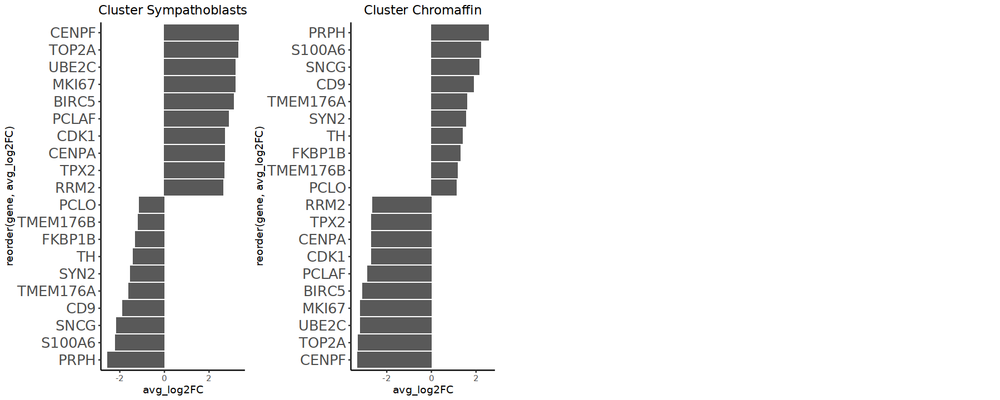

In [187]:
fig.size(6,15)
do.call("grid.arrange", c(plot_list, ncol = 4)) 

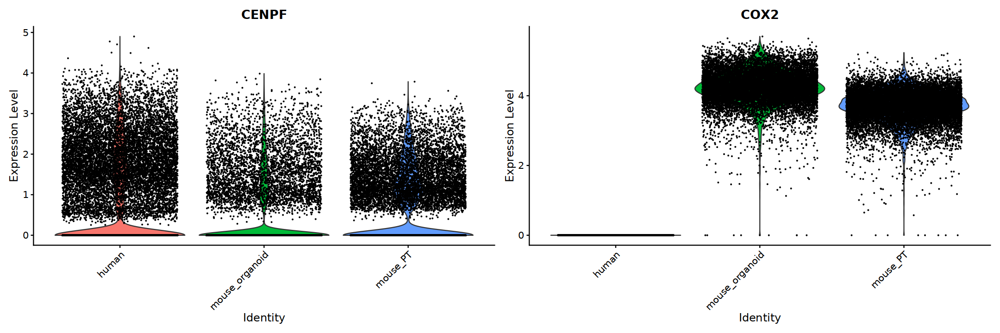

In [197]:
fig.size(6,18)
VlnPlot(object.common.roi, features <- c('CENPF','COX2'), idents = c("Sympathoblasts", "Chromaffin"), group.by = "species_organoid") 

In [206]:
up_down_20 %>% filter(cluster == 'Chromaffin') %>% filter(sign_up == 1) %>% pull(gene)

[1] "PRPH"     "S100A6"   "SNCG"     "CD9"      "TMEM176A" "SYN2"    
 [7] "TH"       "FKBP1B"   "TMEM176B" "PCLO"

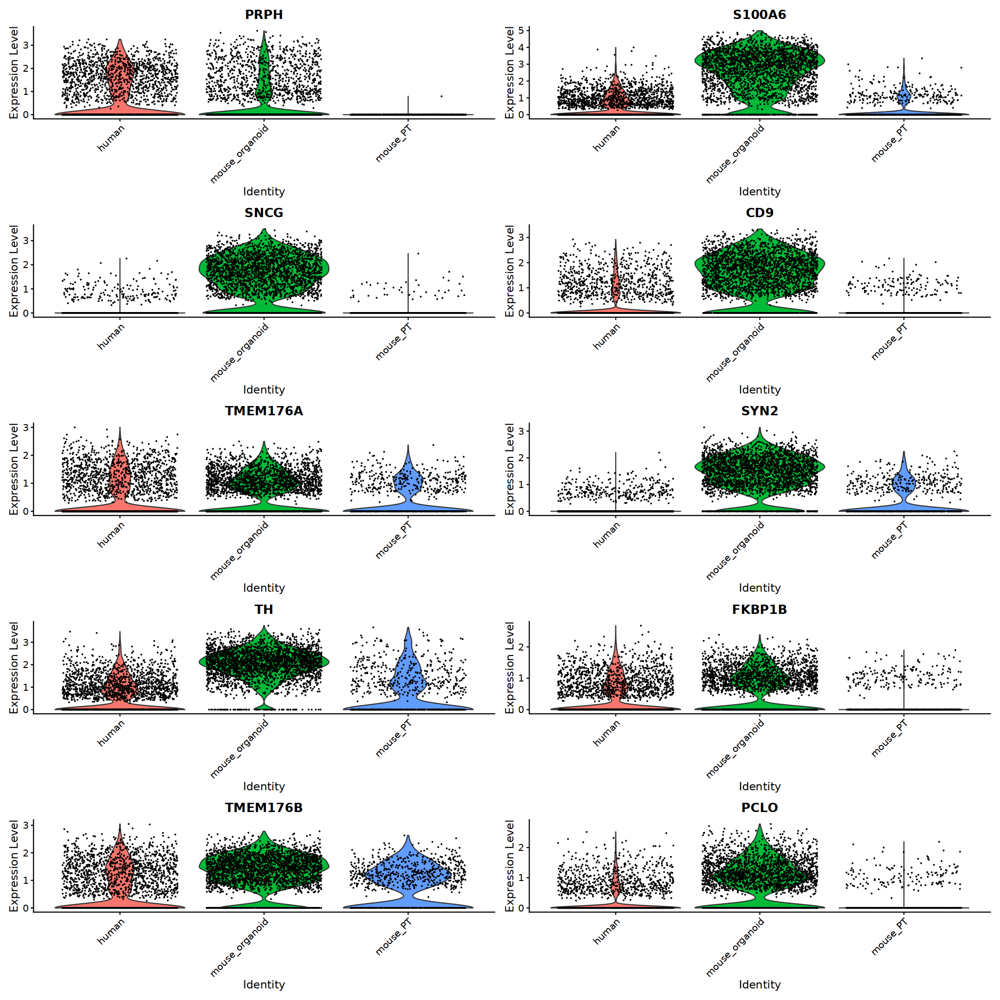

In [207]:
fig.size(18,18)
VlnPlot(object.common.roi, features <- up_down_20 %>% filter(cluster == 'Chromaffin') %>% filter(sign_up == 1) %>% pull(gene), idents = c("Chromaffin"), 
        group.by = "species_organoid", ncol=2) 

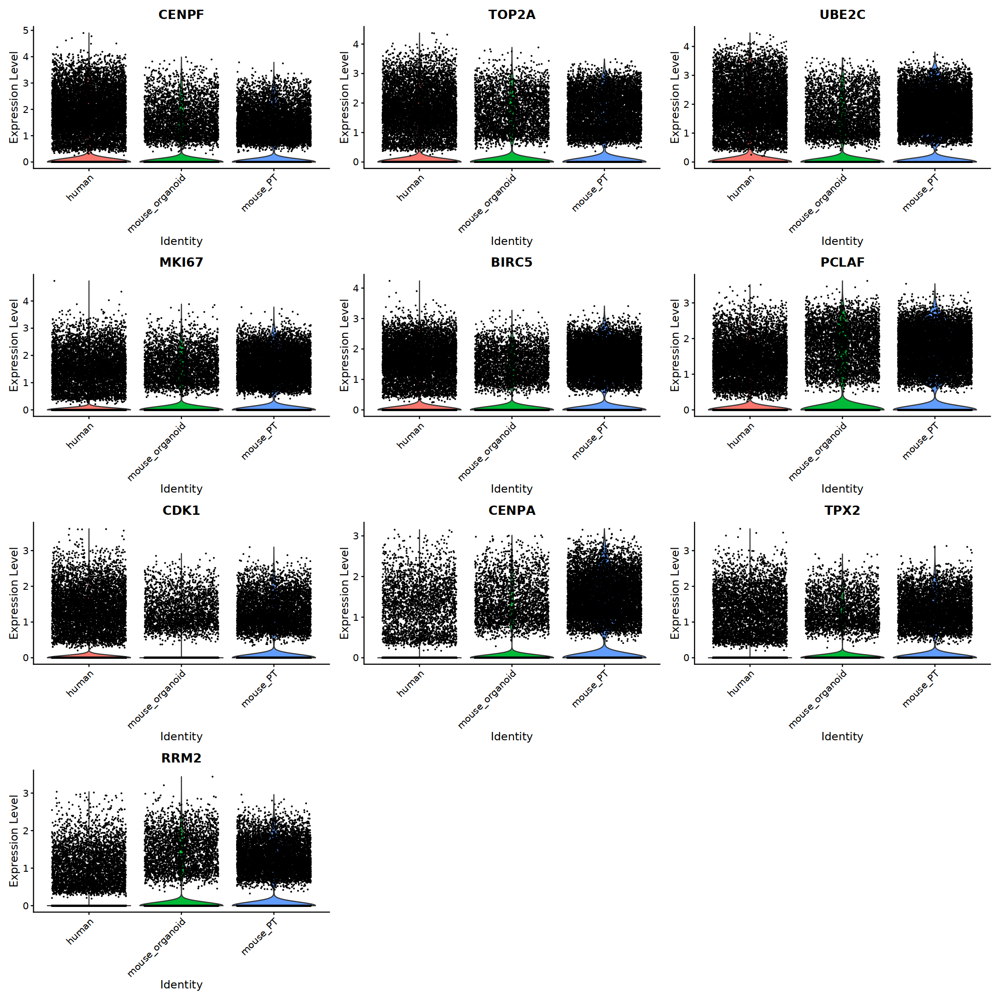

In [209]:
fig.size(18,18)
VlnPlot(object.common.roi, features <- up_down_20 %>% filter(cluster == 'Sympathoblasts') %>% filter(sign_up == 1) %>% pull(gene), idents = c("Sympathoblasts"), 
        group.by = "species_organoid", ncol=3) 

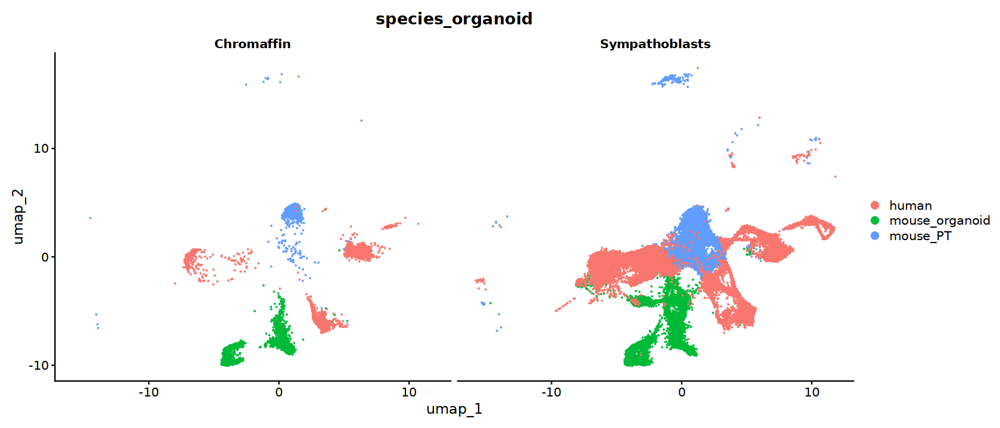

In [175]:
fig.size(6,14)
p = DimPlot(object.common.roi, reduction = "umap", group.by='species_organoid',split.by='annot',
                 label=FALSE,repel=TRUE, label.size = 8)
ggsave(
    plot = p,
    filename = glue::glue(
        '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
        'results/figures/2022/Figure_5/organoid_cross_speceis_tumor_population_unlabeled.pdf'
    ),
    width = 25,
    height = 8,
    dpi=300
)
p

In [139]:
#'STMN2', NEFL, 'ISL1
STMN2<- WhichCells(object = object.common.roi, expression = STMN2 > 2)
NEFL <- WhichCells(object = object.common.roi, expression = NEFL > 2)

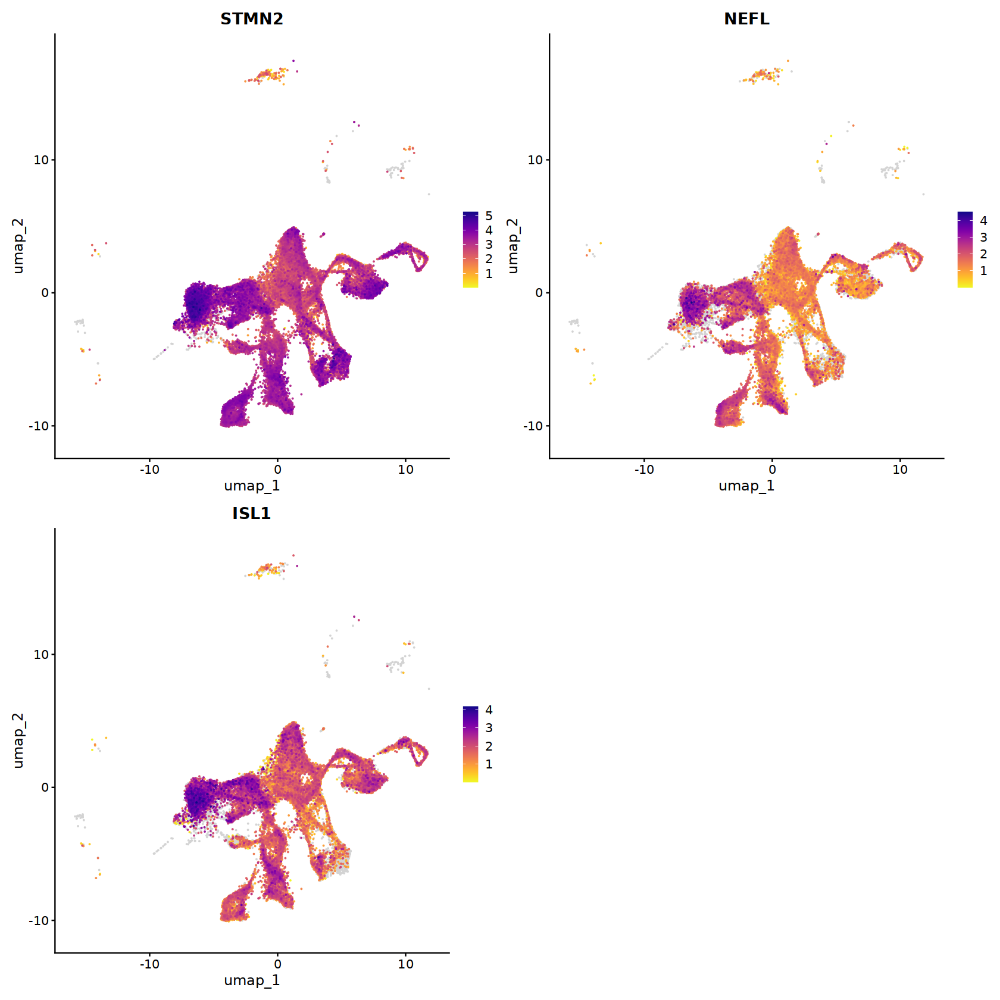

In [144]:
fig.size(14,14)
FeaturePlot_scCustom(object.common.roi, features = c('STMN2', 'NEFL', 'ISL1'))

ERROR: [1m[33mError[39m in `Cell_Highlight_Plot()`:[22m
[1m[22m[33m![39m The list of `cells_highlight` contains duplicate cell names.
[36mℹ[39m Ensure all cell names are unique before plotting.


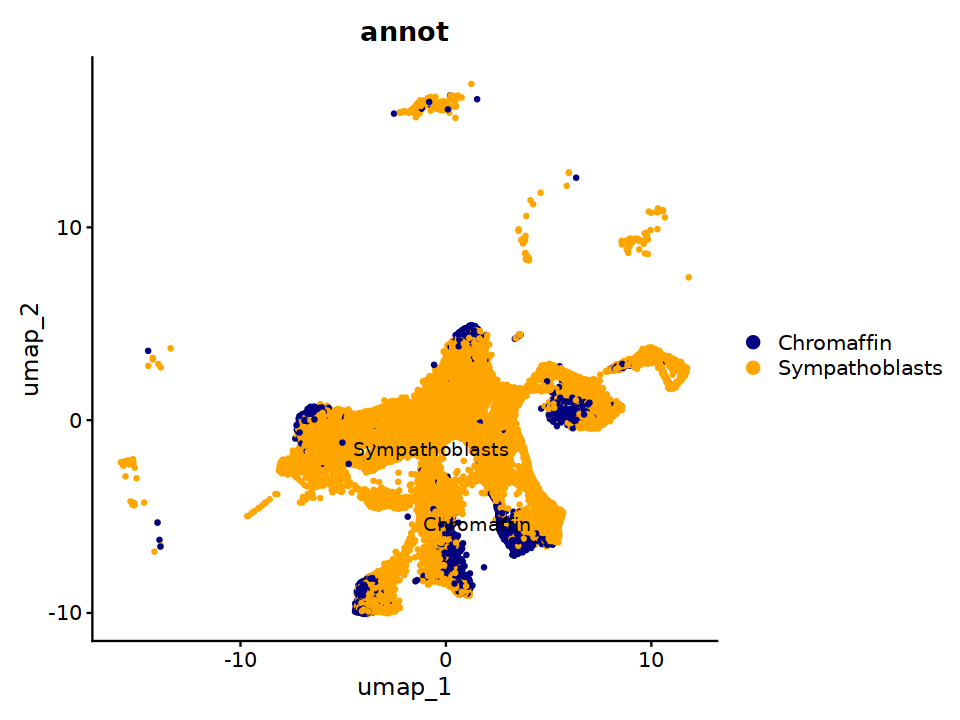

In [136]:
fig.size(6,8)
DimPlot_scCustom(object.common.roi, reduction = "umap", group.by='annot',
                 label=TRUE,repel=TRUE, label.size = 4)

In [93]:
object.common.mm@meta.data %>% head

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,integrated_snn_res.0.5,seurat_clusters,annot,species,S.Score,G2M.Score,⋯,scDblFinder.class,scDblFinder.score,integrated_snn_res.0.2,integrated_snn_res.0.4,integrated_snn_res.0.6,integrated_nn_res.0.8,integrated_clusters,species_cluster,annot.old,annot.backup
,<chr>,<dbl>,<int>,<dbl>,<chr>,<fct>,<chr>,<chr>,<dbl>,<dbl>,⋯,<chr>,<dbl>,<chr>,<chr>,<chr>,<fct>,<fct>,<chr>,<chr>,<chr>
AAACCCAAGAAGCGAA-1_2,no_6_5,5675,2208,5.324347,4,6,Chromaffin,mouse,-0.41290427,-0.9338704,⋯,NA,NA,NA,NA,NA,6,6,Chromaffin_mouse,Chromaffin,Chromaffin
AAACCCAGTAGGTCAG-1_2,no_6_5,6929,2548,5.185801,0,6,Sympathoblasts,mouse,-0.17187614,-0.8678337,⋯,NA,NA,NA,NA,NA,6,6,Sympathoblasts_mouse,G1 phase Sympathoblasts,G1 phase Sympathoblasts
AAACCCAGTGTGACCC-1_2,no_6_5,6191,2291,4.557352,0,11,Sympathoblasts,mouse,-0.32933281,-0.6458345,⋯,NA,NA,NA,NA,NA,11,11,Sympathoblasts_mouse,G1 phase Sympathoblasts,G1 phase Sympathoblasts
AAACGAACAATTTCTC-1_2,no_6_5,5650,2410,3.971727,2,6,Sympathoblasts,mouse,-0.25338140,0.1736820,⋯,NA,NA,NA,NA,NA,6,6,Sympathoblasts_mouse,G2-M phase Sympathoblasts,G2-M phase Sympathoblasts
AAACGAAGTAACGCGA-1_2,no_6_5,5417,2129,3.287381,5,6,Sympathoblasts,mouse,-0.01932856,-0.7541581,⋯,NA,NA,NA,NA,NA,6,6,Sympathoblasts_mouse,G1-S phase Sympathoblasts,G1-S phase Sympathoblasts
AAACGAAGTGATCGTT-1_2,no_6_5,4002,1732,2.867470,5,6,Sympathoblasts,mouse,0.25436321,-0.6722696,⋯,NA,NA,NA,NA,NA,6,6,Sympathoblasts_mouse,G1-S phase Sympathoblasts,G1-S phase Sympathoblasts


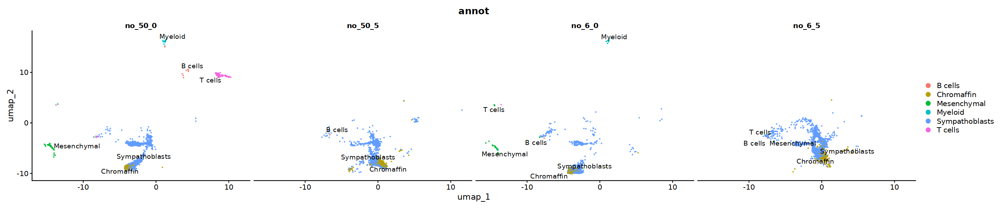

In [177]:
fig.size(5,24)

p = DimPlot(object.common.mm, reduction = "umap", group.by='annot', split.by = 'orig.ident',
                 label=TRUE,repel=TRUE, label.size = 4)
ggsave(
    plot = p,
    filename = glue::glue(
        '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
        'results/figures/2022/Figure_5/organoid_mouse_shared_embedding_non_tumor.pdf'
    ),
    width = 24,
    height = 5,
    dpi=300
)
p

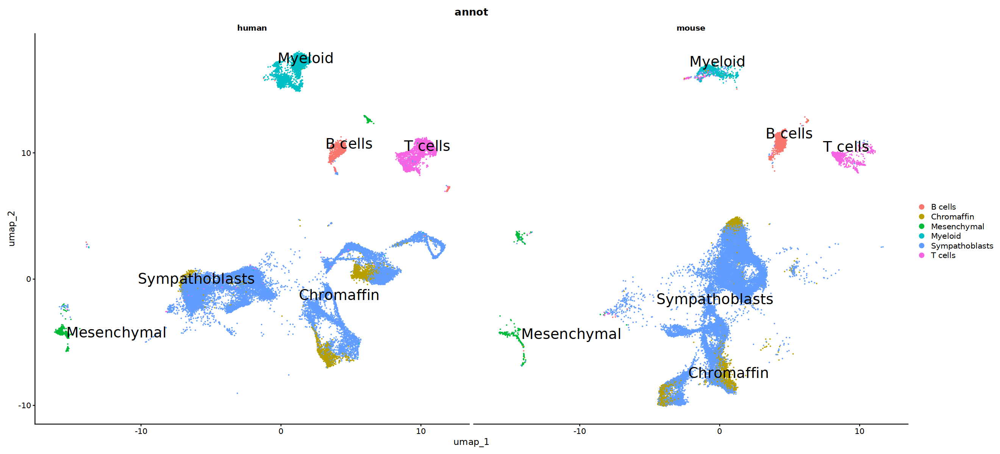

In [134]:
fig.size(10,22)
DimPlot(object.common, reduction = "umap", group.by='annot', split.by = 'species',
                 label=TRUE,repel=TRUE, label.size = 8)

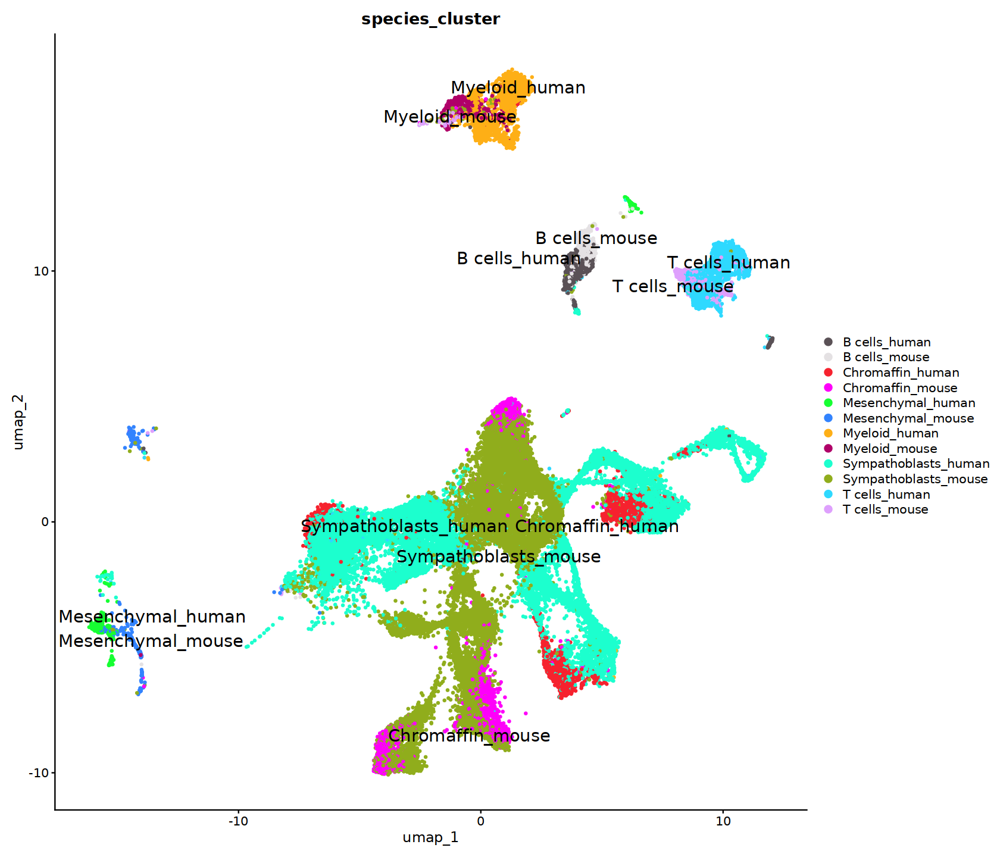

In [141]:
fig.size(12,14)
DimPlot_scCustom(object.common, reduction = "umap", group.by='species_cluster',
                 label=TRUE,repel=TRUE, label.size = 6)

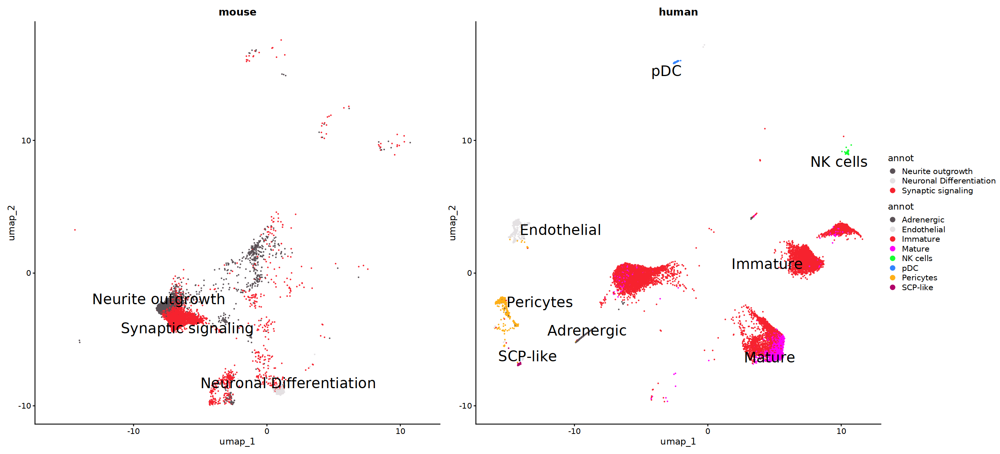

In [135]:
fig.size(10,22)
DimPlot_scCustom(object.uncommon, reduction = "umap", group.by='annot', split.by = 'species',
                 label=TRUE,repel=TRUE, label.size = 8)

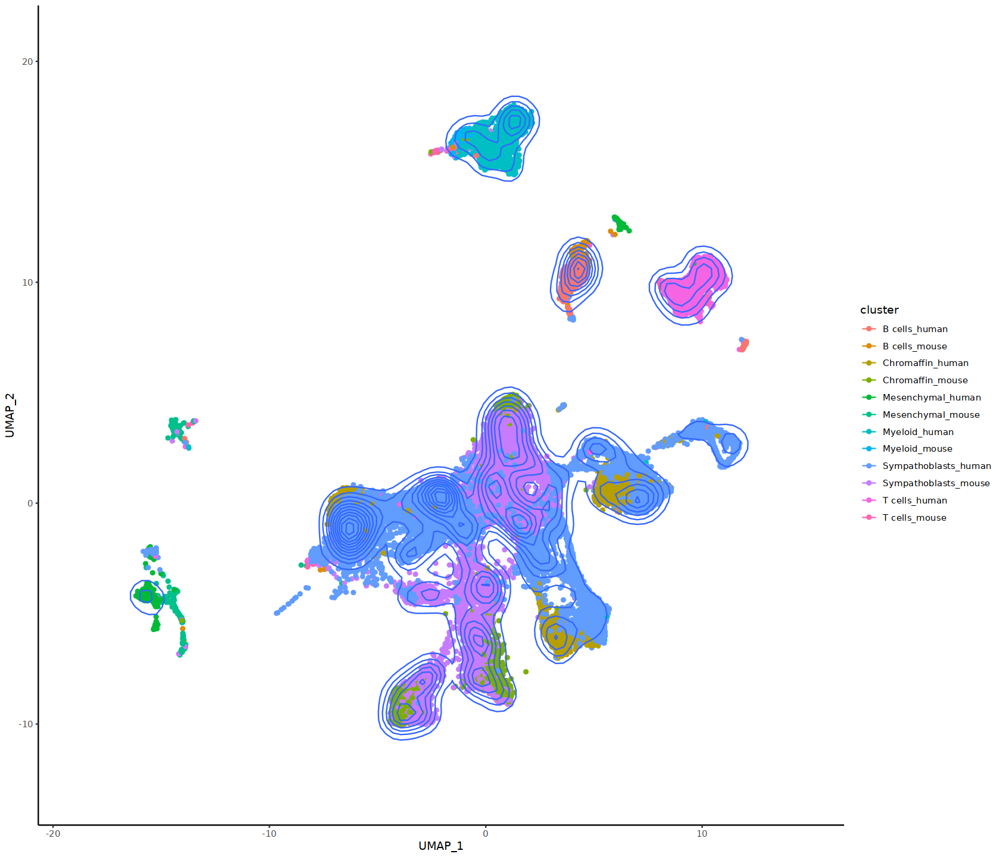

In [161]:
umap_data <- data.frame(Embeddings(object.common[['umap']]))
umap_data$seurat_clusters = object.common$species_cluster
colnames(umap_data) = c('UMAP_1', 'UMAP_2', 'cluster')
data = umap_data
ggplot(data) + geom_point(aes(x=UMAP_1, y=UMAP_2, color=cluster), show.legend = TRUE)+
    geom_density2d(aes(x=UMAP_1, y=UMAP_2)) + 
    theme_classic() +
    scale_x_continuous(limits=c(min(data$UMAP_1) - .10*diff(range(data$UMAP_1)),max(data$UMAP_1) + .10*diff(range(data$UMAP_1))))+
    scale_y_continuous(limits=c(min(data$UMAP_2) - .10*diff(range(data$UMAP_2)),max(data$UMAP_2) + .10*diff(range(data$UMAP_2))))

In [160]:
colnames(umap_data)

[1] "UMAP_1"  "UMAP_2"  "cluster"

In [169]:
object.common@meta.data %>% pull(annot) %>% unique %>% length

[1] 6

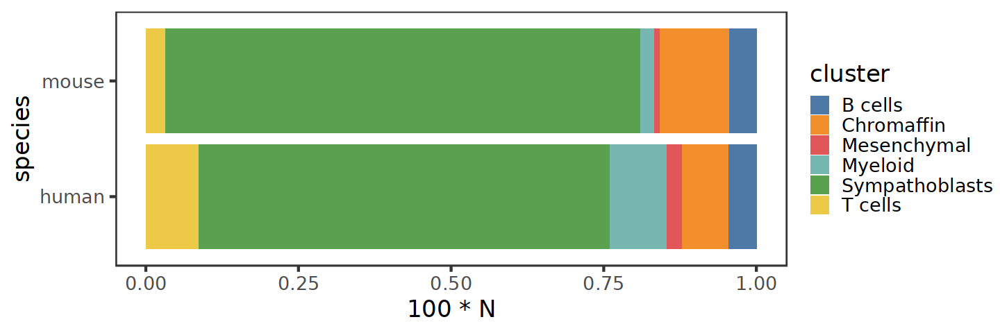

In [169]:
fig.size(4,12)
p = object.common@meta.data %>%
    with(prop.table(table( species, annot ), 1)) %>%
    data.table() %>%
    mutate(cluster = annot) %>%
    ggplot(aes(species, 100*N, fill = cluster)) +
    geom_bar(stat = 'identity', position = position_fill()) +
    ggthemes::scale_fill_tableau() +
    coord_flip() +
    theme_test(base_size = 20)

ggsave(
    plot = p,
    filename = glue::glue(
        '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
        'results/figures/2022/Figure_5/organoid_cross_speceis_common_cell_proportion.pdf'
    ),
    width = 16,
    height = 6,
    dpi=300
)
p

In [172]:
object.common@meta.data %>%
    with(prop.table(table( species, annot ), 1)) %>%
    data.table() %>%
    mutate(cluster = factor(annot, (0:6)))

species,annot,N,cluster
<chr>,<chr>,<dbl>,<fct>
human,B cells,0.045752019,NA
mouse,B cells,0.044951462,NA
human,Chromaffin,0.077265491,NA
mouse,Chromaffin,0.113491622,NA
human,Mesenchymal,0.023966747,NA
mouse,Mesenchymal,0.009738453,NA
human,Myeloid,0.093331761,NA
mouse,Myeloid,0.022846720,NA
human,Sympathoblasts,0.673427274,NA


----------------------------------------------------------------------------------------------------------------

In [92]:
annotation.hs.df = openxlsx::read.xlsx(
    '../Figure3A_20230629_6_samples_dong_integration_annotations.xlsx')

In [93]:
annot = annotation.hs.df$Annotation

In [94]:
tumor.int$annot = annot[ tumor.int@meta.data$`integrated_snn_res.0.5` ]

In [95]:
tumor.int$annot = factor(tumor.int$annot, levels = unique(annotation.hs.df$Annotation)  ) 

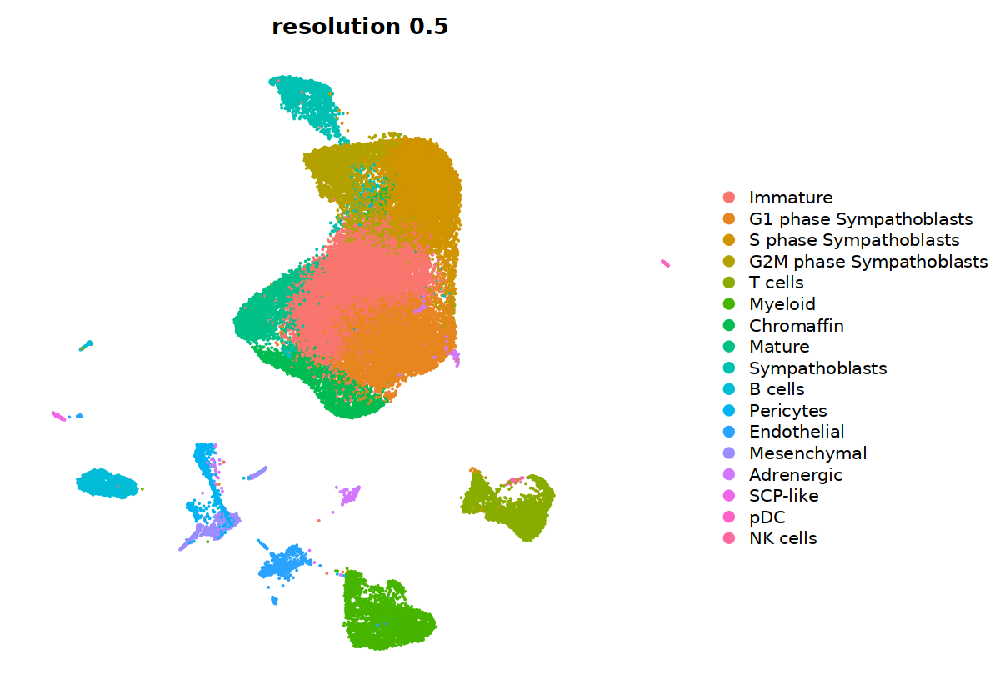

In [96]:
fig.size(7,10)
DimPlot(tumor.int, label = F, repel = T, reduction = "umap",
               group.by = "annot")+labs(title="resolution 0.5") + NoAxes()

In [97]:
signature.df$Annotation %>% unique

[1] "Synaptic signaling"       "Neurite outgrowth"       
[3] "S phase Sympathoblasts"   "Neuronal Differentiation"

In [98]:
tumor.int$annot %>% levels

[1] "Immature"                 "G1 phase Sympathoblasts" 
 [3] "S phase Sympathoblasts"   "G2M phase Sympathoblasts"
 [5] "T cells"                  "Myeloid"                 
 [7] "Chromaffin"               "Mature"                  
 [9] "Sympathoblasts"           "B cells"                 
[11] "Pericytes"                "Endothelial"             
[13] "Mesenchymal"              "Adrenergic"              
[15] "SCP-like"                 "pDC"                     
[17] "NK cells"

In [ ]:
tumor.int.subset = subset(
    x = tumor.int,
    idents = signature.df$Annotation %>% unique
)

#options(repr.plot.height=15, repr.plot.width=8, res=200)
fig.size(4,10)
#adr.obj.small = adr.obj[dotplot_genes$Gene[2: length(dotplot_genes$Gene)],]
pdot = DotPlot(
       organoid.subset, 
        assay='RNA',
        features = signature.df$Mouse.Gene %>% rev, 
        group.by='annot', 
        scale = TRUE,
        scale.by = 'size',
        cols = c("lightgrey", "darkred")
       )+ ggtitle("Mouse Signature Plot") +
        #coord_flip()+
    theme(
        plot.title = element_text(hjust = 0.5),
        axis.text.x = element_text(size=15,angle = 90, hjust = 1,vjust = 0.7),
        axis.text.y = element_text(size=15)
    ) 

pdot

In [22]:
adr.obj = readRDS(glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/heatmap_objects/mouse_obj.rds'
        )
)
tmp = as.vector(adr.obj$annot.rename)
tmp[tmp == 'Granulocyte neutrophils']  = 'Neutrophils'
tmp[tmp == 'Macrophages'] = 'Myeloid'
names(tmp) = names(adr.obj$annot.rename)
adr.obj$annot.rename = as.factor(tmp)

tmp2 = as.vector(tumor.int$annot)
tmp2[tmp2 == 'Macrophages'] = 'Myeloid'
names(tmp2) = names(tumor.int$annot)
tumor.int$annot = as.factor(tmp2)
all.ctypes = union( levels(adr.obj$annot.rename), levels(tumor.int$annot) )


In [23]:
tumor.int$annot <- factor(tumor.int$annot, levels = all.ctypes)
adr.obj$annot.rename <- factor(adr.obj$annot.rename, 
                               levels = all.ctypes)
color_code = scales::hue_pal()(length(all.ctypes))
names(color_code) =  all.ctypes

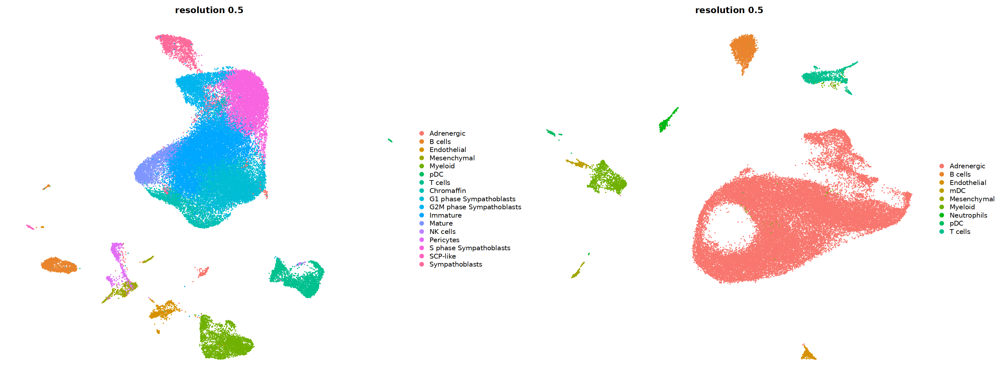

In [24]:
fig.size(10,26)
p.hs = DimPlot(tumor.int, label = F, repel = T, reduction = "umap", cols = color_code,
               group.by = "annot")+labs(title="resolution 0.5") + NoAxes()

p.mm = DimPlot(adr.obj, label = F, repel = T, reduction = "umap", cols = color_code,
               group.by = "annot.rename")+labs(title="resolution 0.5") + NoAxes()
p.hs | p.mm


In [25]:
all.ctypes

[1] "Adrenergic"               "B cells"                 
 [3] "Endothelial"              "mDC"                     
 [5] "Mesenchymal"              "Myeloid"                 
 [7] "Neutrophils"              "pDC"                     
 [9] "T cells"                  "Chromaffin"              
[11] "G1 phase Sympathoblasts"  "G2M phase Sympathoblasts"
[13] "Immature"                 "Mature"                  
[15] "NK cells"                 "Pericytes"               
[17] "S phase Sympathoblasts"   "SCP-like"                
[19] "Sympathoblasts"

In [26]:
cell_types = list(
  stromal = c("Mesenchymal", "Endothelial", "Pericytes", "SCP-like"),
  immune = c("B cells", "mDC", "Myeloid", "Neutrophils", "pDC", "T cells", "NK cells"),
  other = c("Adrenergic", "Chromaffin", "Sympathoblasts", "Immature", "Mature",
            "G1 phase Sympathoblasts", "G2M phase Sympathoblasts", "S phase Sympathoblasts")
)

In [27]:
cell_types$stromal

[1] "Mesenchymal" "Endothelial" "Pericytes"   "SCP-like"

In [21]:
library(conflicted)

In [28]:
tumor.int@meta.data$species = "human"

In [160]:
tmp1 = tumor.int@meta.data %>% dplyr::select(annot,species) 

In [30]:
adr.obj@meta.data$species = 'mouse'

In [161]:
tmp2 = adr.obj@meta.data %>% dplyr::select(annot.rename, species) %>% mutate(annot=annot.rename) %>% dplyr::select(annot, species)

In [162]:
tmp3 = rbind(tmp1, tmp2)

In [163]:
library(data.table)

In [164]:
tmp4 = tmp3 %>%
    filter(annot %in% cell_types$stromal )
tmp4$annot = droplevels(tmp4$annot)

In [165]:
tmp4 %>% pull(annot) %>% unique

[1] Mesenchymal Pericytes   Endothelial SCP-like   
Levels: Endothelial Mesenchymal Pericytes SCP-like

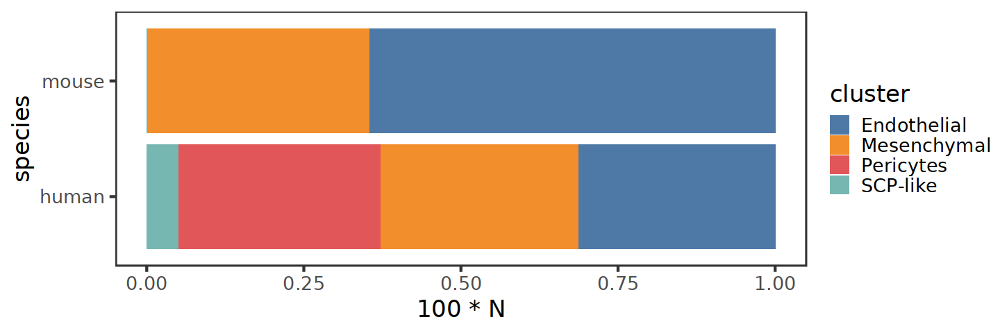

In [170]:
tmp4 = tmp3 %>%
    filter(annot %in% cell_types$stromal )
tmp4$annot = droplevels(tmp4$annot)
fig.size(4,12)
p = tmp4 %>%
    with(prop.table(table( species, annot ), 1)) %>%
    data.table() %>%
    mutate(cluster = annot) %>%
    ggplot(aes(species, 100*N, fill = cluster)) +
    geom_bar(stat = 'identity', position = position_fill()) +
    ggthemes::scale_fill_tableau() +
    coord_flip() +
    theme_test(base_size = 20)
ggsave(
    plot = p,
    filename = glue::glue(
        '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
        'results/figures/2022/Figure_3/TH_MYCN_human_mouse_cell_proportion_stromal.pdf'
    ),
    width = 12,
    height = 4,
    dpi=300
)
p

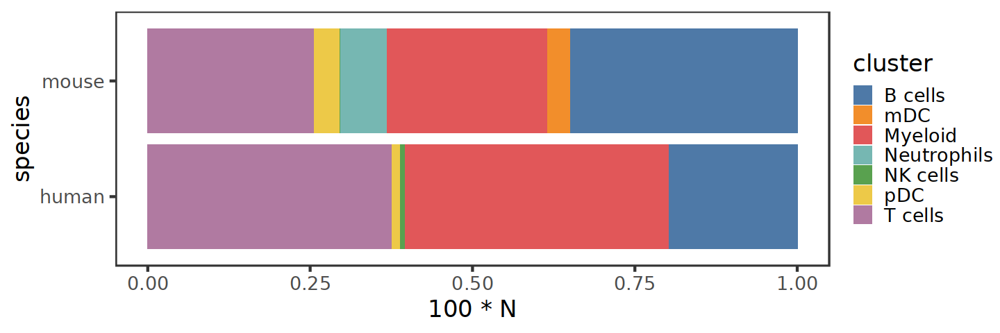

In [171]:
tmp4 = tmp3 %>%
    filter(annot %in% cell_types$immune )
tmp4$annot = droplevels(tmp4$annot)
fig.size(4,12)
p = tmp4 %>%
    with(prop.table(table( species, annot ), 1)) %>%
    data.table() %>%
    mutate(cluster = annot) %>%
    ggplot(aes(species, 100*N, fill = cluster)) +
    geom_bar(stat = 'identity', position = position_fill()) +
    ggthemes::scale_fill_tableau() +
    coord_flip() +
    theme_test(base_size = 20)

ggsave(
    plot = p,
    filename = glue::glue(
        '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
        'results/figures/2022/Figure_3/TH_MYCN_human_mouse_cell_proportion_immune.pdf'
    ),
    width = 12,
    height = 4,
    dpi=300
)
p

In [3]:
library(SeuratData)
library(SeuratDisk)

Using cached data manifest, last updated at 2023-08-27 15:22:21.435817

Registered S3 method overwritten by 'SeuratDisk':
  method            from  
  as.sparse.H5Group Seurat



In [4]:
source('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/scripts/SeuratRun.r')

Loading required package: Matrix

Loading required package: igraph


Attaching package: ‘igraph’


The following object is masked from ‘package:circlize’:

    degree


The following objects are masked from ‘package:dplyr’:

    as_data_frame, groups, union


The following object is masked from ‘package:Seurat’:

    components


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union




In [ ]:
save_seurat_as_pagoda(
    organoid,
    glue::glue(
        '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/data/with_ribo/',
        'organoid_6_samples.bin'
    ),
    app.title = 'organoid_6_samples'
)

39593 cells, 31410 genes; normalizing ... 

Using plain model 

Winsorizing ... 

log scale ... 

done.


calculating variance fit ...

 using gam 

3355 overdispersed genes ... 3355

persisting ... 

done.

running PCA using 3000 OD genes .

.

.

.

 done




creating space of type angular done
adding data ... done
building index ... done
querying ... done


Estimating embeddings.


running tSNE using 20 cores:




creating space of type angular done
adding data ... done
building index ... done
querying ... done
Calculating hdea...


Using multilevel clustering for PCA space




In [8]:
!pwd

ERROR: Error in eval(expr, envir, enclos): object 'pwd' not found
